In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import datetime as dt
import math
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode,iplot
%matplotlib inline

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [2]:
retail_df = pd.read_excel("Online Retail.xlsx")

In [3]:
retail_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


In [4]:
retail_df.tail()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France
541908,581587,22138,BAKING SET 9 PIECE RETROSPOT,3,2011-12-09 12:50:00,4.95,12680.0,France


In [5]:
retail_df.shape

(541909, 8)

In [6]:
retail_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


In [7]:
for i in retail_df.columns:
    print(i," ", len(retail_df[i].unique()))

InvoiceNo   25900
StockCode   4070
Description   4224
Quantity   722
InvoiceDate   23260
UnitPrice   1630
CustomerID   4373
Country   38


In [8]:
retail_df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


In [9]:
retail_df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')

# *Data cleaning*

In [10]:
retail_df.isna().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

In [11]:
# Checking  missing values in 'CustomerID' column
miss_value = retail_df['CustomerID'].isnull().sum()/(retail_df.shape[0]) * 100
print("We have {:.2f} % of missing values in 'CustomerID' Column".format(miss_value))

We have 24.93 % of missing values in 'CustomerID' Column


In [12]:
# Checking  missing values in 'Description' column
miss_value1 = retail_df['Description'].isnull().sum()/(retail_df.shape[0]) * 100
print("We have {:.2f} % of missing values in 'Description' Column".format(miss_value1))

We have 0.27 % of missing values in 'Description' Column


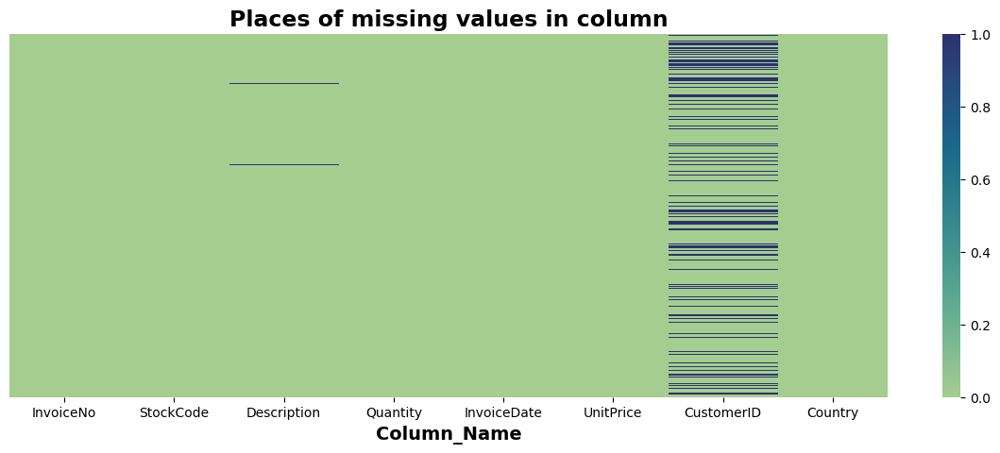

In [13]:
plt.figure(figsize=(15, 5))
sns.heatmap(retail_df.isnull(), cbar=True, yticklabels=False, cmap="crest")
plt.xlabel("Column_Name", size=14, weight="bold")
plt.title("Places of missing values in column",fontweight="bold",size=17)
plt.show()


After looking into the null values, we can clearly see that the ColumnID of our dataset has the highest number of ~ 25% NAN values which could impact our result. But with the missing value in Description column are quite less, infact < 1% of total value which could not impact on our result.

So, its better to drop all there missing values from our data dataset.

In [14]:
retail_df.dropna(inplace=True)

In [15]:
retail_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 406829 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    406829 non-null  object        
 1   StockCode    406829 non-null  object        
 2   Description  406829 non-null  object        
 3   Quantity     406829 non-null  int64         
 4   InvoiceDate  406829 non-null  datetime64[ns]
 5   UnitPrice    406829 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      406829 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 27.9+ MB


In [16]:
retail_df.shape

(406829, 8)

In [17]:
retail_df.describe()

,Quantity,UnitPrice,CustomerID
count,406829.000000,406829.000000,406829.000000
mean,12.061303,3.460471,15287.690570
std,248.693370,69.315162,1713.600303
min,-80995.000000,0.000000,12346.000000
25%,2.000000,1.250000,13953.000000
50%,5.000000,1.950000,15152.000000
75%,12.000000,3.750000,16791.000000
max,80995.000000,38970.000000,18287.000000


# *EDA*

In [18]:
cl_retail_df = retail_df.copy()

In [19]:
top_customers = pd.DataFrame(cl_retail_df['CustomerID'].value_counts().sort_values(ascending = False).reset_index())
top_customers.rename(columns = {'index':'CustomerID','CustomerID':'count'},inplace = True)
top_customers.head()

,CustomerID,count
0,17841.0,7983
1,14911.0,5903
2,14096.0,5128
3,12748.0,4642
4,14606.0,2782


Text(0.5, 1.0, "Top 5 Cusotmer's ID.")

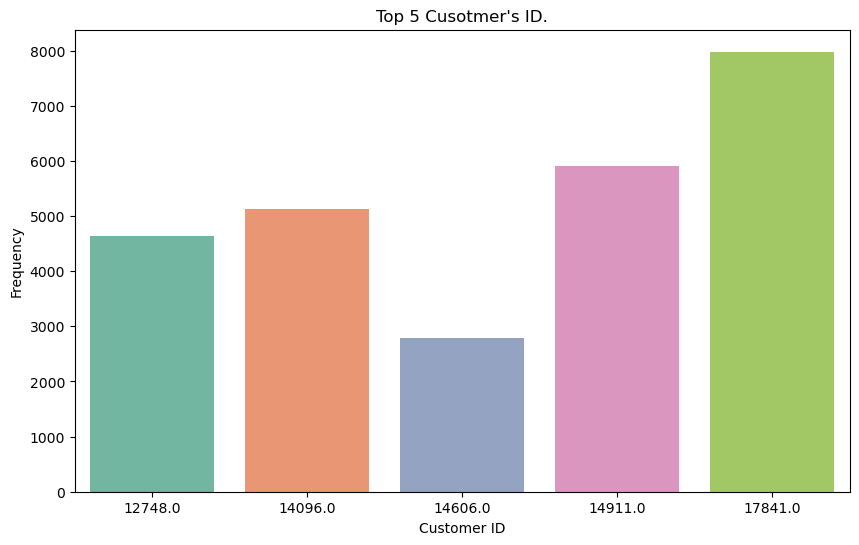

In [20]:
# Plotting top five customers 
plt.figure(figsize = (10,6))
sns.barplot(x = 'CustomerID',y = 'count',palette= 'Set2',data = top_customers[:5])
plt.xlabel('Customer ID')
plt.ylabel('Frequency')
plt.title("Top 5 Cusotmer's ID.")

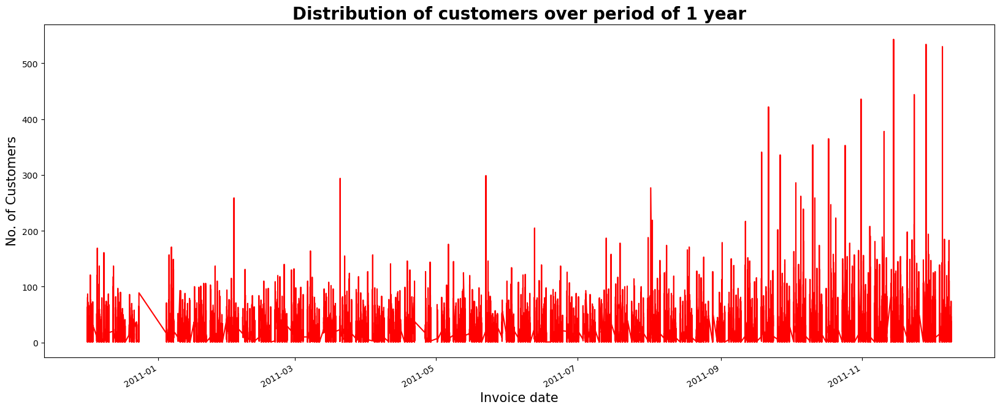

In [21]:
## customer distribution in 1 year time period
plt.figure(figsize=(20,8))
customer_distribution = cl_retail_df.groupby('InvoiceDate').count()['CustomerID'].plot(color='red')

## Set title and x, y labels
plt.title('Distribution of customers over period of 1 year', size=20, fontweight='bold')
plt.xlabel('Invoice date', size=15)
plt.ylabel('No. of Customers', size=15)
plt.show()

In [22]:
cl_retail_df['Country'].unique()

array(['United Kingdom', 'France', 'Australia', 'Netherlands', 'Germany',
       'Norway', 'EIRE', 'Switzerland', 'Spain', 'Poland', 'Portugal',
       'Italy', 'Belgium', 'Lithuania', 'Japan', 'Iceland',
       'Channel Islands', 'Denmark', 'Cyprus', 'Sweden', 'Austria',
       'Israel', 'Finland', 'Greece', 'Singapore', 'Lebanon',
       'United Arab Emirates', 'Saudi Arabia', 'Czech Republic', 'Canada',
       'Unspecified', 'Brazil', 'USA', 'European Community', 'Bahrain',
       'Malta', 'RSA'], dtype=object)

In [23]:
cl_retail_df['Country'].value_counts()

United Kingdom          361878
Germany                   9495
France                    8491
EIRE                      7485
Spain                     2533
Netherlands               2371
Belgium                   2069
Switzerland               1877
Portugal                  1480
Australia                 1259
Norway                    1086
Italy                      803
Channel Islands            758
Finland                    695
Cyprus                     622
Sweden                     462
Austria                    401
Denmark                    389
Japan                      358
Poland                     341
USA                        291
Israel                     250
Unspecified                244
Singapore                  229
Iceland                    182
Canada                     151
Greece                     146
Malta                      127
United Arab Emirates        68
European Community          61
RSA                         58
Lebanon                     45
Lithuani

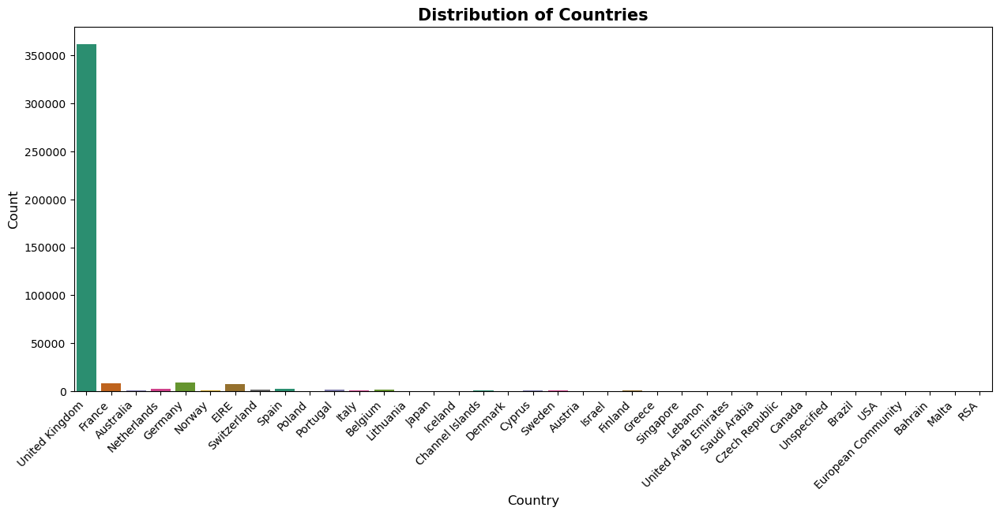

In [24]:
plt.figure(figsize=(15,6))
sns.countplot(x='Country', data=cl_retail_df, palette ='Dark2')
plt.xticks(rotation=45, ha='right')
plt.title("Distribution of Countries",fontsize = 15, fontweight="bold")
plt.ylabel("Count", fontsize = 12)
plt.xlabel("Country",fontsize = 12)
plt.show()

In [25]:
top_countries = pd.DataFrame(cl_retail_df['Country'].value_counts().sort_values(ascending = False).reset_index())
top_countries['Country %']= top_countries['Country']*100/cl_retail_df['Country'].count()
top_countries.rename(columns = {'index':'Country','Country':'Total Counts'},inplace = True)
top_countries.head()

,Country,Total Counts,Country %
0,United Kingdom,361878,88.950886
1,Germany,9495,2.333904
2,France,8491,2.087118
3,EIRE,7485,1.839839
4,Spain,2533,0.622620


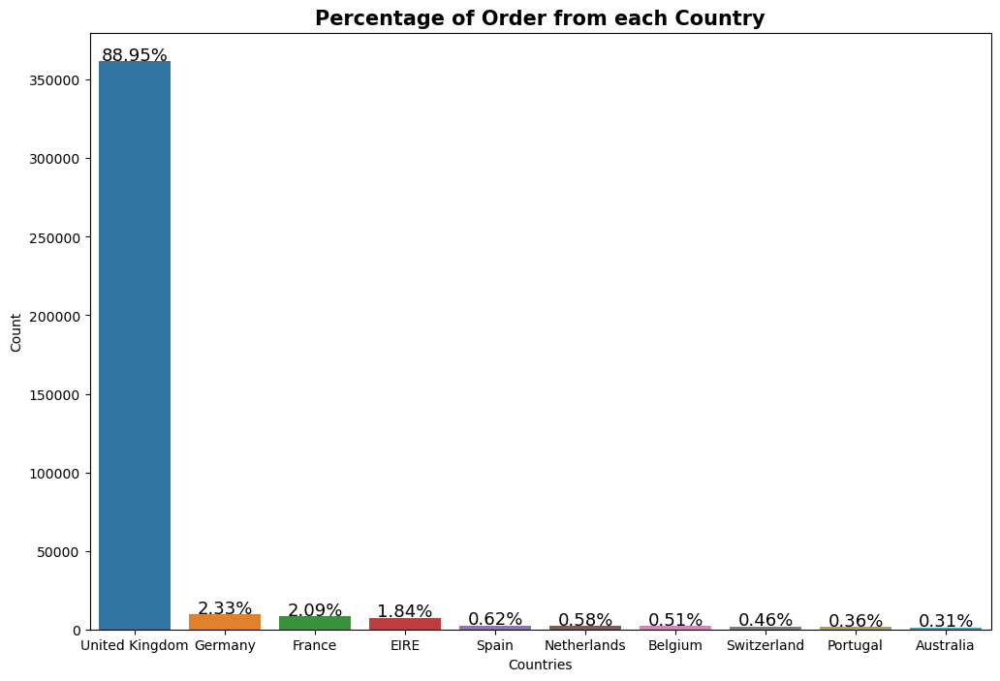

In [26]:
fig, ax = plt.subplots(figsize = (12,8))
splot = sns.barplot(x='Country',y='Total Counts',data = top_countries[:10])
plt.title('Percentage of Order from each Country', size = 15, fontweight ='bold')
plt.xlabel('Countries', size = 10)
plt.ylabel('Count', size = 10)
for p in splot.patches:                              
    height = p.get_height()
    splot.text(p.get_x()+p.get_width()/2, height+500, '{:1.2f}''%'.format(height/cl_retail_df.shape[0]*100),ha = "center", size = 13)

Among these ten coountries:

88.92% customers are from United Kingdom.
2.30%, 2.12%, 1.84% and 0.63% customers are from Germany, France, Eire and Spain respectively.
Remain customers belong to other coutries like Netherlands, Belgium, Switzerland, Portugal, and Australia.

In [27]:
temp = cl_retail_df[['CustomerID', 'InvoiceNo', 'Country']].groupby(['CustomerID', 'InvoiceNo', 'Country']).count()
temp = temp.reset_index(drop = False)
countries = temp['Country'].value_counts()
print('Number of countries from where orders made: {}'.format(len(countries)))

Number of countries from where orders made: 37


In [28]:
data = dict(type='choropleth',
locations = countries.index,
locationmode = 'country names', z = countries,
text = countries.index, colorbar = {'title':'Order Number'},
colorscale=[[0, 'rgb(224,255,255)'],
            [0.01, 'rgb(166,206,227)'], [0.02, 'rgb(31,120,180)'],
            [0.03, 'rgb(178,223,138)'], [0.05, 'rgb(51,160,44)'],
            [0.10, 'rgb(251,154,153)'], [0.20, 'rgb(255,255,0)'],
            [1, 'rgb(227,26,28)']],    
reversescale = False)
#_______________________
layout = dict(title='<b>Number of Orders per Country</b>', width = 900, height = 600,
geo = dict(showframe = True))
#______________
choromap = go.Figure(data = [data], layout = layout)
choromap.update_layout(title_x=0.5, font=dict(size=15))
choromap.update_traces(colorbar_thickness= 20,selector=dict(type='choropleth'))
iplot(choromap, validate=False)

In [29]:
Top_description=cl_retail_df['Description'].value_counts().reset_index()
Top_description.rename(columns={'index': 'Product_Name'}, inplace=True)
Top_description.rename(columns={'Description': 'Count'}, inplace=True)
Top_description.head()

,Product_Name,Count
0,WHITE HANGING HEART T-LIGHT HOLDER,2070
1,REGENCY CAKESTAND 3 TIER,1905
2,JUMBO BAG RED RETROSPOT,1662
3,ASSORTED COLOUR BIRD ORNAMENT,1418
4,PARTY BUNTING,1416


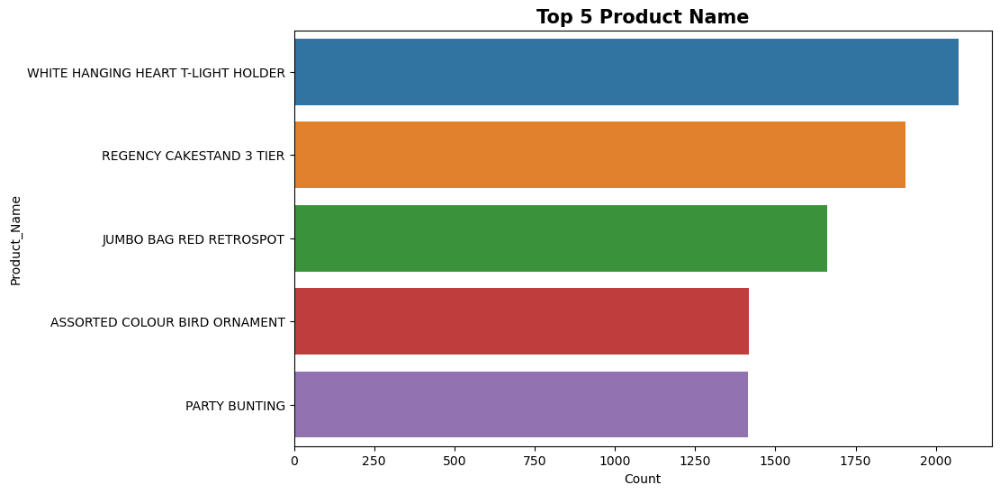

In [30]:
plt.figure(figsize=(10,6))
plt.title('Top 5 Product Name', fontweight='bold', size=15)
sns.barplot(y='Product_Name',x='Count',data=Top_description[:5])
plt.show()

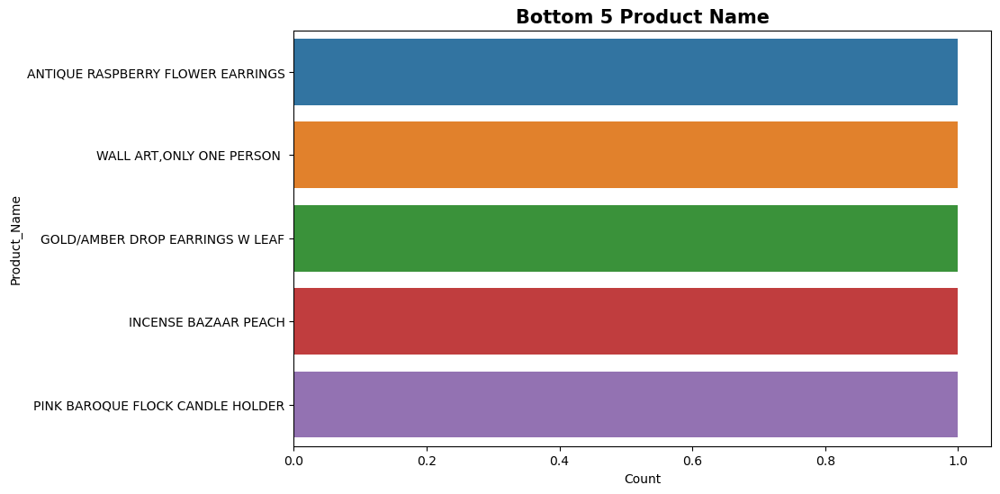

In [31]:
plt.figure(figsize=(10,6))
plt.title('Bottom 5 Product Name', fontweight='bold', size=15)
sns.barplot(y='Product_Name',x='Count',data=Top_description[-5:])
#plt.xticks(rotation=45, ha='right')
plt.show()

In [32]:
Top_stock =cl_retail_df['StockCode'].value_counts().reset_index()
Top_stock.rename(columns={'index': 'StockCode_Value'}, inplace=True)
Top_stock.rename(columns={'StockCode': 'Count'}, inplace=True)
Top_stock.head()

,StockCode_Value,Count
0,85123A,2077
1,22423,1905
2,85099B,1662
3,84879,1418
4,47566,1416


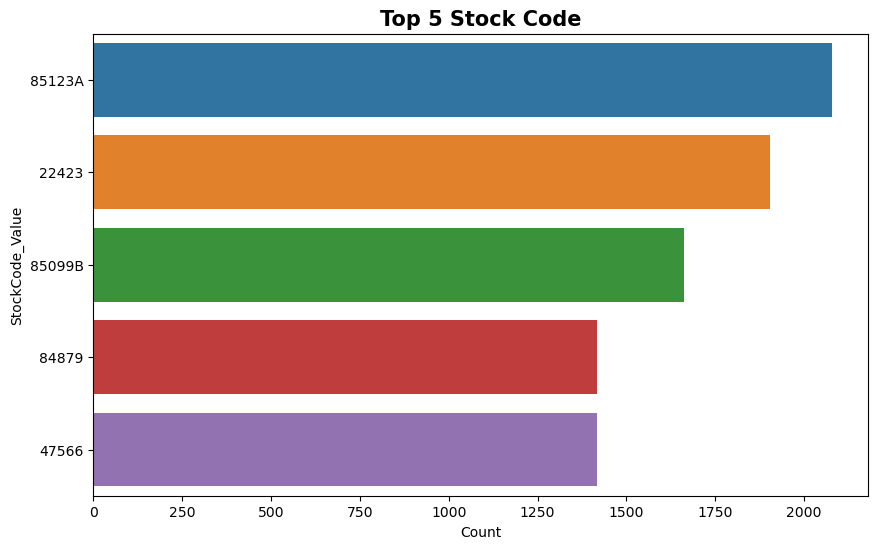

In [33]:
plt.figure(figsize=(10,6))
plt.title('Top 5 Stock Code', fontweight='bold', size=15)
sns.barplot(y='StockCode_Value',x='Count',data=Top_stock[:5])
plt.show()

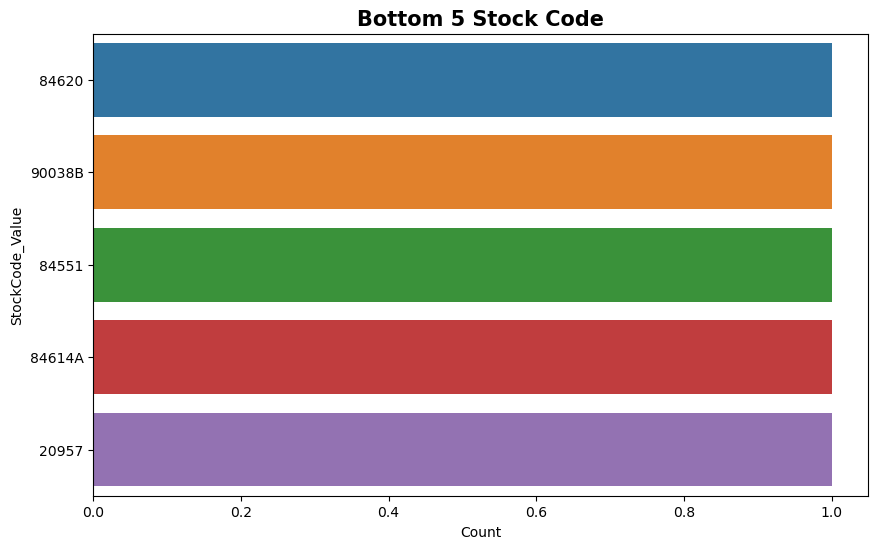

In [34]:
plt.figure(figsize=(10,6))
plt.title('Bottom 5 Stock Code', fontweight='bold', size=15)
sns.barplot(y='StockCode_Value',x='Count',data=Top_stock[-5:])
plt.show()

# *Feature Engineering*

In [35]:
cl_retail_df["InvoiceDate"] = pd.to_datetime(cl_retail_df["InvoiceDate"], format="%Y-%m-%d %H:%M:%S")
#Convert 'InvoiceDate' column into date time formate

In [36]:
cl_retail_df["Year"] = cl_retail_df["InvoiceDate"].apply(lambda x: x.year)
cl_retail_df["Month_Num"] = cl_retail_df["InvoiceDate"].apply(lambda x: x.month)
cl_retail_df["Day_Num"] = cl_retail_df["InvoiceDate"].apply(lambda x: x.day)
cl_retail_df["Hour"] = cl_retail_df["InvoiceDate"].apply(lambda x: x.hour)
cl_retail_df["Minute"] = cl_retail_df["InvoiceDate"].apply(lambda x: x.minute)
#Create some new features from Invoicedate like Hours,Year,Month_Num,Day_Num

In [37]:
cl_retail_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month_Num,Day_Num,Hour,Minute
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,2010,12,1,8,26
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,12,1,8,26
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,2010,12,1,8,26
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,12,1,8,26
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,12,1,8,26


In [38]:
cl_retail_df['TotalAmount']=cl_retail_df['Quantity']*cl_retail_df['UnitPrice']
#Creating a new feature: Total Amount

In [39]:
cl_retail_df['Month']=cl_retail_df['InvoiceDate'].dt.month_name()

In [40]:
cl_retail_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month_Num,Day_Num,Hour,Minute,TotalAmount,Month
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,2010,12,1,8,26,15.30,December
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,12,1,8,26,20.34,December
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,2010,12,1,8,26,22.00,December
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,12,1,8,26,20.34,December
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010,12,1,8,26,20.34,December


# *Business Context*

In [41]:
bus_retail_df = cl_retail_df.copy()

In [42]:
def business_insight(data):
  if(data < 0):
    return 'Bad for Business'
  else:
    return 'Good for Business'
  return data

In [43]:
# applying business insight function on Total_Amount
bus_retail_df['Business_insight'] = bus_retail_df['TotalAmount'].apply(business_insight)

In [44]:
# aggregating business_insight in a column
business_insight_df = pd.DataFrame(bus_retail_df.groupby('Business_insight',sort = False).agg({'CustomerID': 'count'}))
business_insight_df.head()

,CustomerID
Business_insight,
Good for Business,397924
Bad for Business,8905


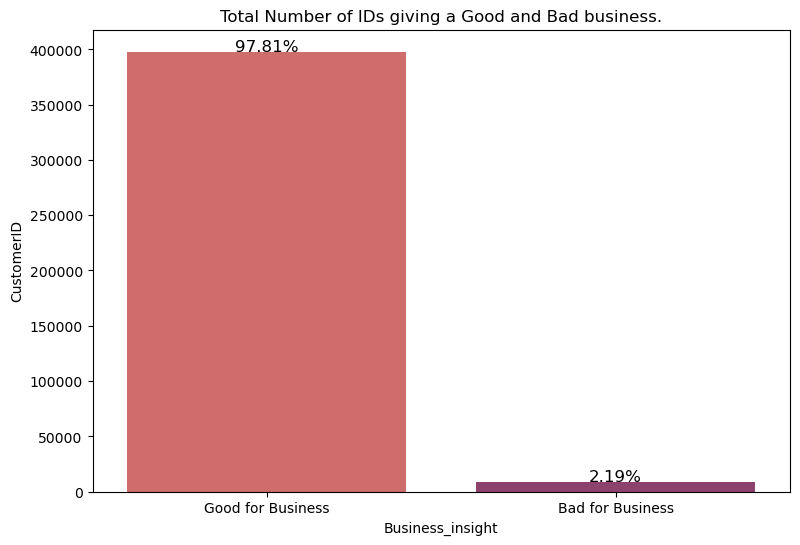

In [45]:
# Having some insights about cancelled orders to tag them bad for business growth
fig, ax = plt.subplots(figsize = (9,6))
sns.barplot(x= business_insight_df.index, y=business_insight_df['CustomerID'], palette = 'flare')
plt.title('Total Number of IDs giving a Good and Bad business.')

for p in ax.patches:                               
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2, height+30, '{:1.2f}''%'.format(height/cl_retail_df.shape[0]*100),ha = "center", size = 12)

There are 2.19% customers who cancelled their orders So, In order to grow our business we need keep an eye on these type customers and their ordering and purchasing behaviour, Why do they cancel orders? The reason is unknown.

But there is an positive insight too, which shows there are total of 97.79% customers who are good for our business purpose.

# *Dropping Cancelled Items*

In [46]:
cl_retail_df['InvoiceNo'] = cl_retail_df['InvoiceNo'].astype('str')

In [47]:
cl_retail_df= cl_retail_df[~ cl_retail_df['InvoiceNo'].str.contains('C')]

In [48]:
cl_retail_df.shape

(397924, 15)

In [49]:
cl_retail_df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'Year', 'Month_Num', 'Day_Num',
       'Hour', 'Minute', 'TotalAmount', 'Month'],
      dtype='object')

In [50]:
num_features = list(cl_retail_df.select_dtypes(['int64','float64']))
num_features

['Quantity',
 'UnitPrice',
 'CustomerID',
 'Year',
 'Month_Num',
 'Day_Num',
 'Hour',
 'Minute',
 'TotalAmount']

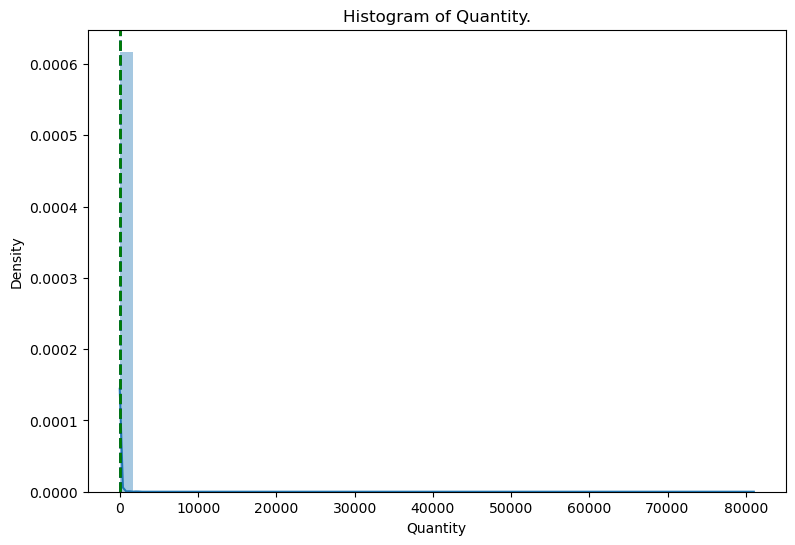

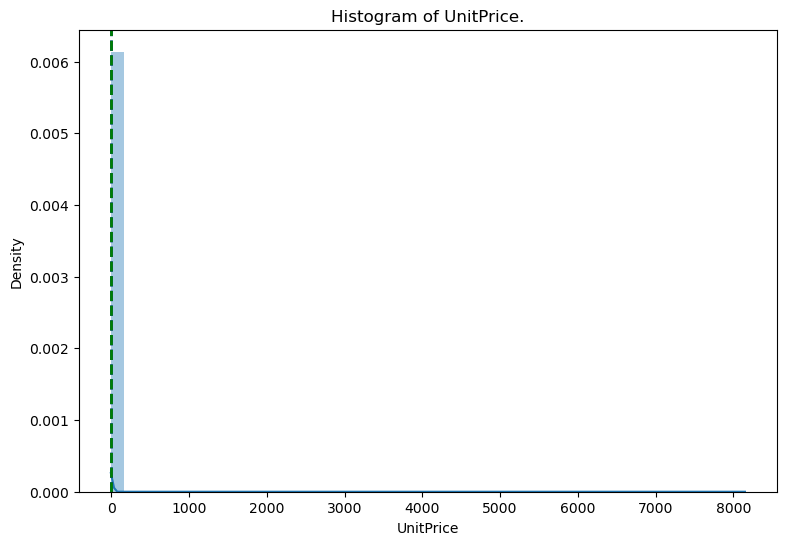

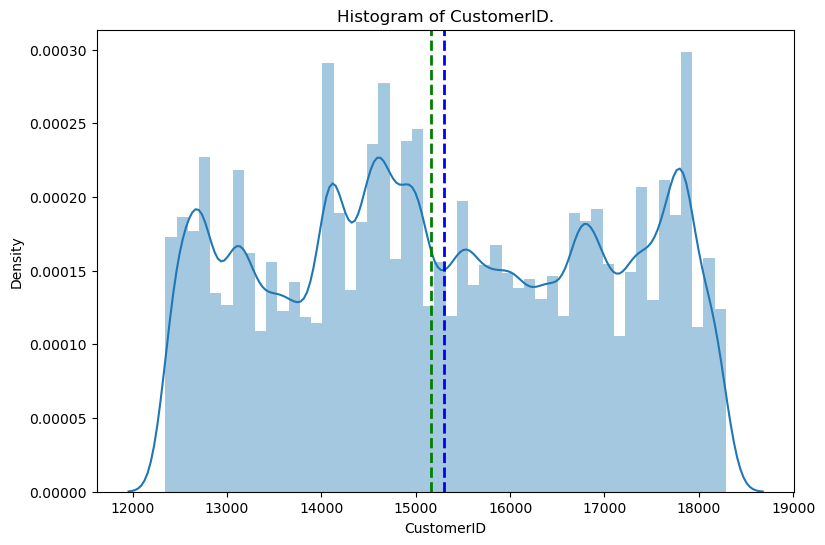

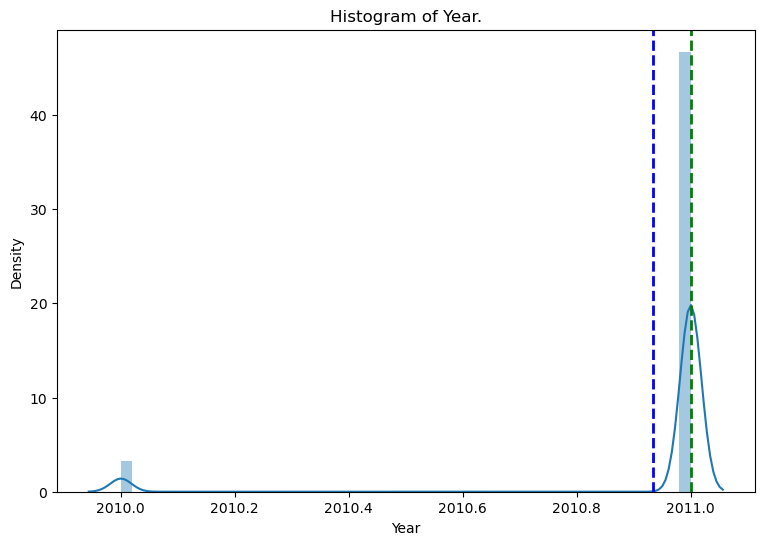

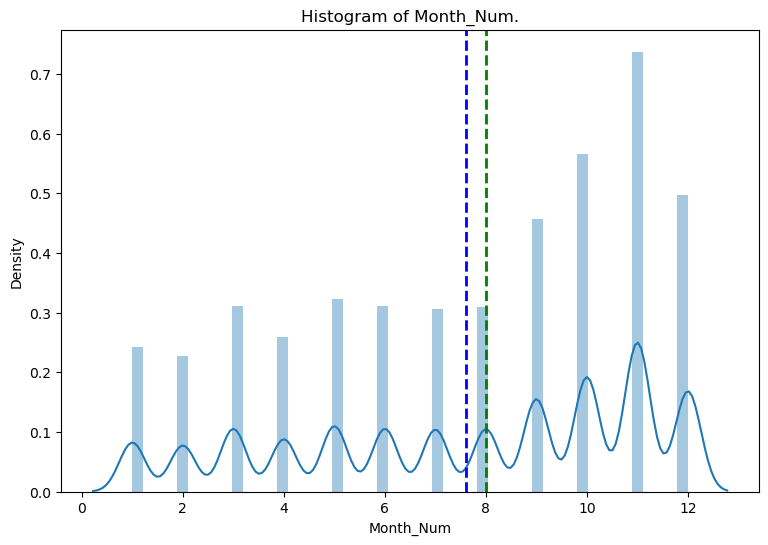

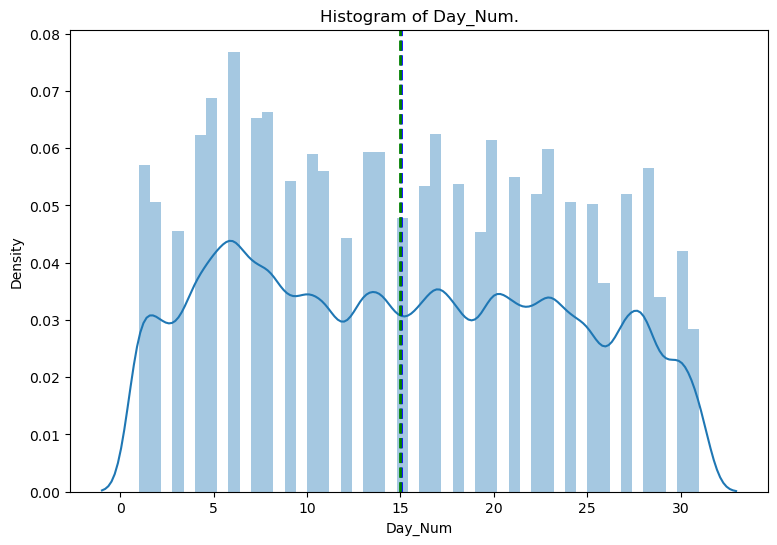

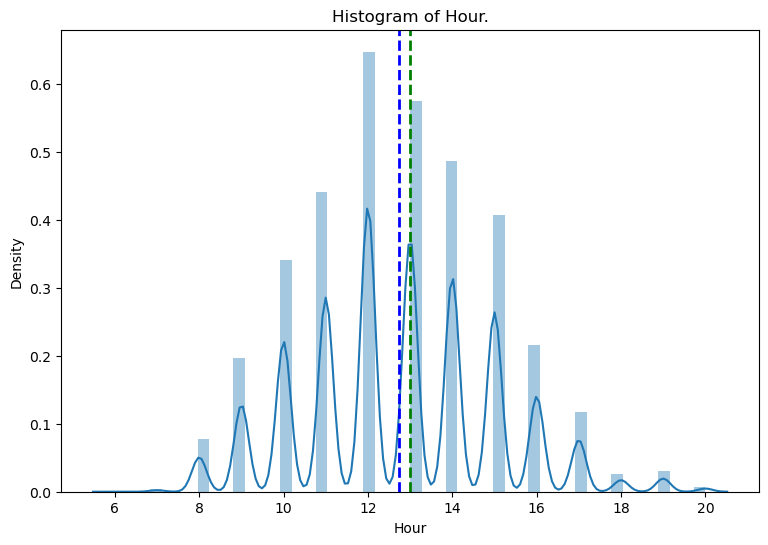

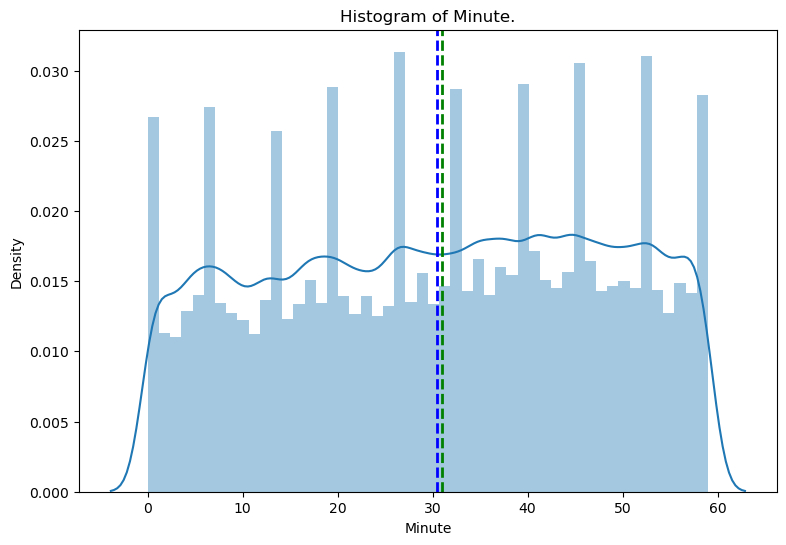

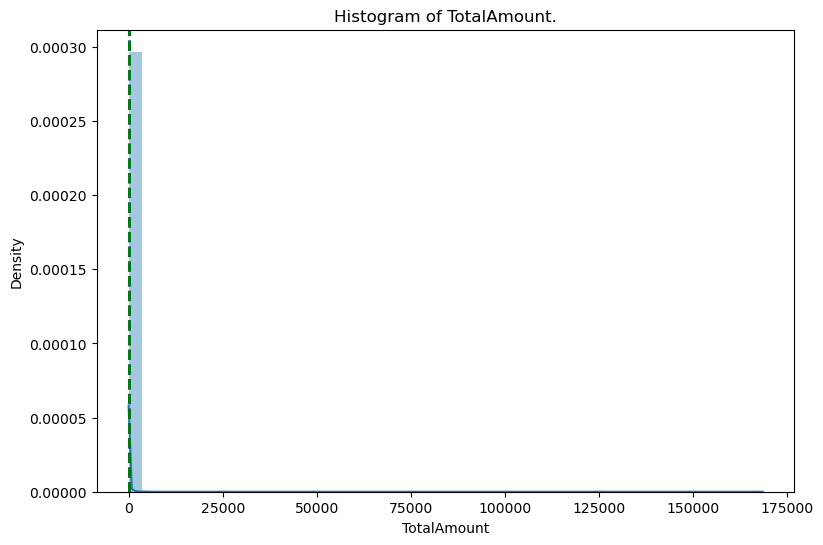

In [51]:
for col in num_features:
  fig=plt.figure(figsize=(9,6))
  ax=fig.gca()
  feature = (cl_retail_df[col])
  sns.distplot(cl_retail_df[col],ax = ax)
  ax.axvline(feature.mean(),color='blue', linestyle='dashed', linewidth=2)
  ax.axvline(feature.median(),color='green', linestyle='dashed', linewidth=2)
  ax.set_title(f'Histogram of {col}.')
  plt.show()

Exploring some important features:
Quantity,
Unit Price,
Total Amount

In [52]:
cl_retail_df['Quantity'].describe()

count    397924.000000
mean         13.021823
std         180.420210
min           1.000000
25%           2.000000
50%           6.000000
75%          12.000000
max       80995.000000
Name: Quantity, dtype: float64

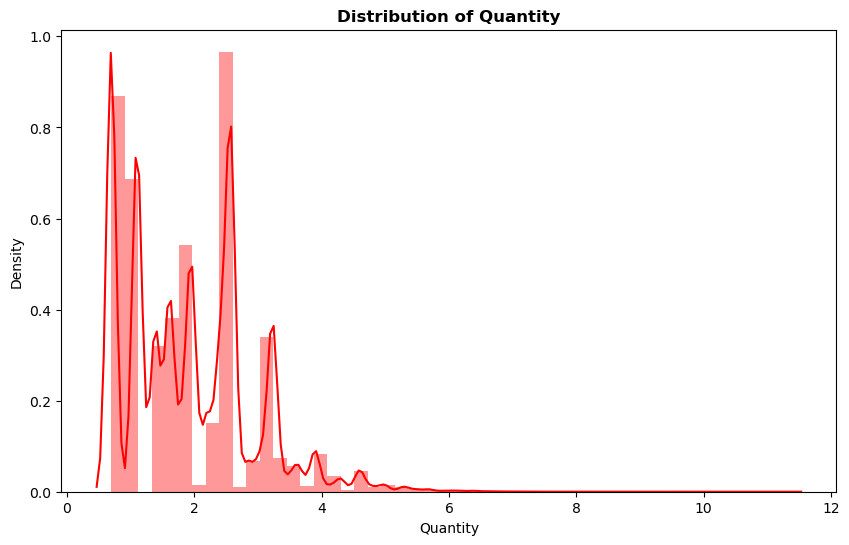

In [53]:
# Distribution of Quantity
fig = plt.figure(figsize = (10,6))
sns.distplot(np.log1p(cl_retail_df['Quantity']),color="red")
plt.title('Distribution of Quantity', fontweight='bold')
plt.xlabel('Quantity')
plt.show()

In [54]:
cl_retail_df['UnitPrice'].describe()

count    397924.000000
mean          3.116174
std          22.096788
min           0.000000
25%           1.250000
50%           1.950000
75%           3.750000
max        8142.750000
Name: UnitPrice, dtype: float64

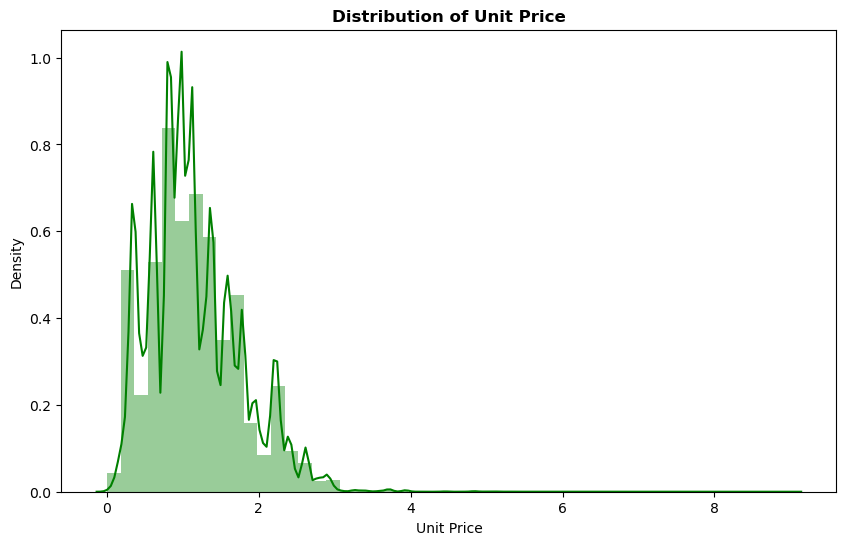

In [55]:
# Distribution of Unit Price
plt.figure(figsize = (10,6))
sns.distplot(np.log1p(cl_retail_df['UnitPrice']),color="green")
plt.title('Distribution of Unit Price', fontweight='bold')
plt.xlabel('Unit Price')
plt.show()

In [56]:
cl_retail_df['TotalAmount'].describe()

count    397924.000000
mean         22.394749
std         309.055588
min           0.000000
25%           4.680000
50%          11.800000
75%          19.800000
max      168469.600000
Name: TotalAmount, dtype: float64

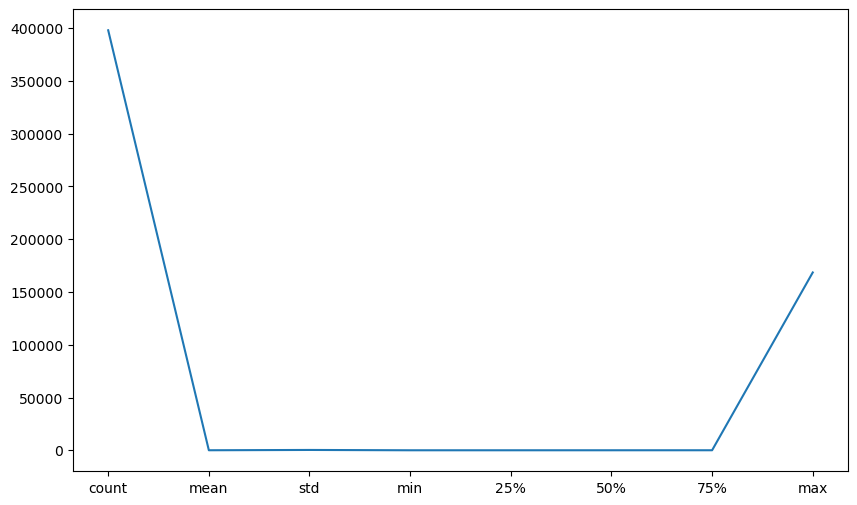

In [57]:
plt.figure(figsize=(10,6))
cl_retail_df['TotalAmount'].describe().plot()
plt.show()

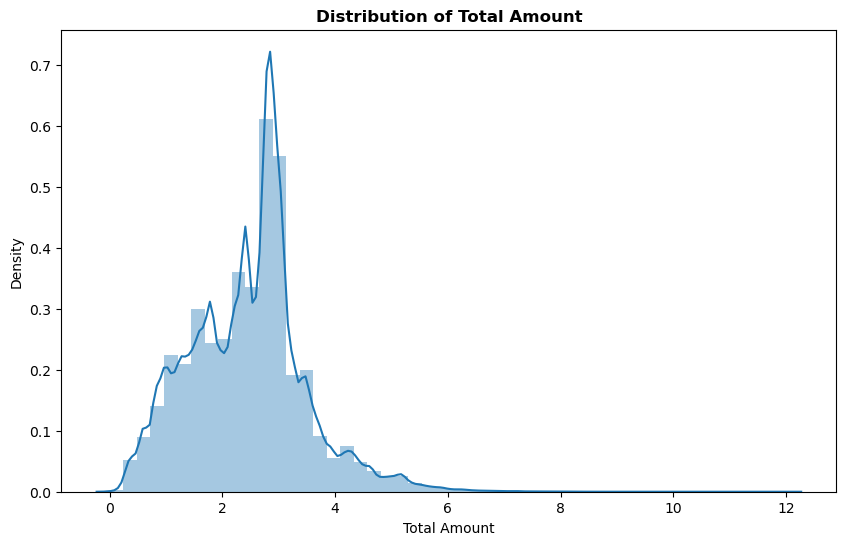

In [58]:
# Distribution of total amounts
plt.figure(figsize = (10,6))
sns.distplot(np.log1p(cl_retail_df['TotalAmount']))
plt.title('Distribution of Total Amount', fontweight='bold')
plt.xlabel('Total Amount')
plt.show()

# *Total Purchasing in Years*

In [59]:
# Creating dataframe for Invoice_Year
purchase_year = cl_retail_df['Year'].value_counts().sort_values(ascending = False).reset_index()
purchase_year.rename(columns = {'index':'Year','Year':'Frequency'},inplace = True)
purchase_year

,Year,Frequency
0,2011,371764
1,2010,26160


Text(0.5, 1.0, 'Total Purchasing in Years')

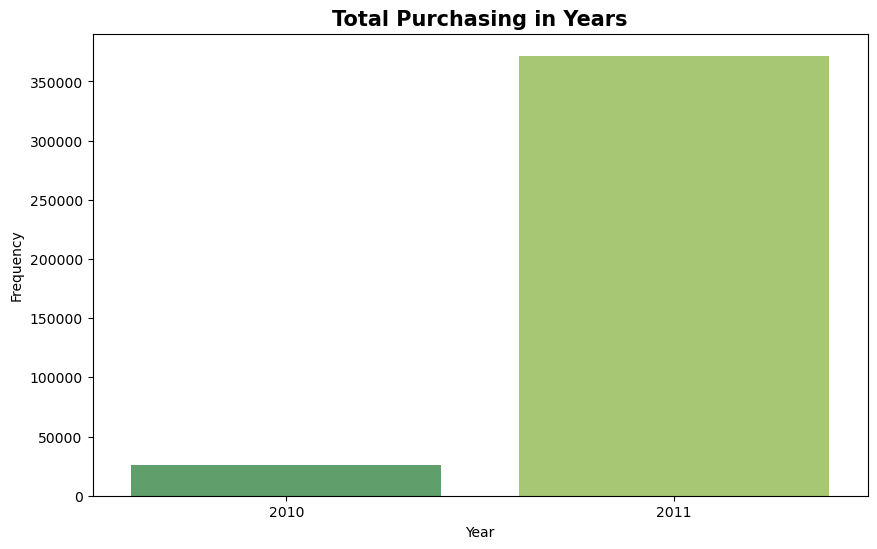

In [60]:
# Plotting total invoices with year
plt.figure(figsize = (10,6))
sns.barplot(x = 'Year',y ='Frequency',palette= 'summer',data = purchase_year)
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.title("Total Purchasing in Years", fontweight ='bold',size=15)

# *Top Months*

In [61]:
# Creating dataframe for Invoice_Months counts
top_months = pd.DataFrame(cl_retail_df['Month'].value_counts().sort_values(ascending = False).reset_index())
top_months.rename(columns = {'index':'Month','Month':'Total Frequency'},inplace = True)
top_months.head()

,Month,Total Frequency
0,November,64545
1,October,49557
2,December,43464
3,September,40030
4,May,28322


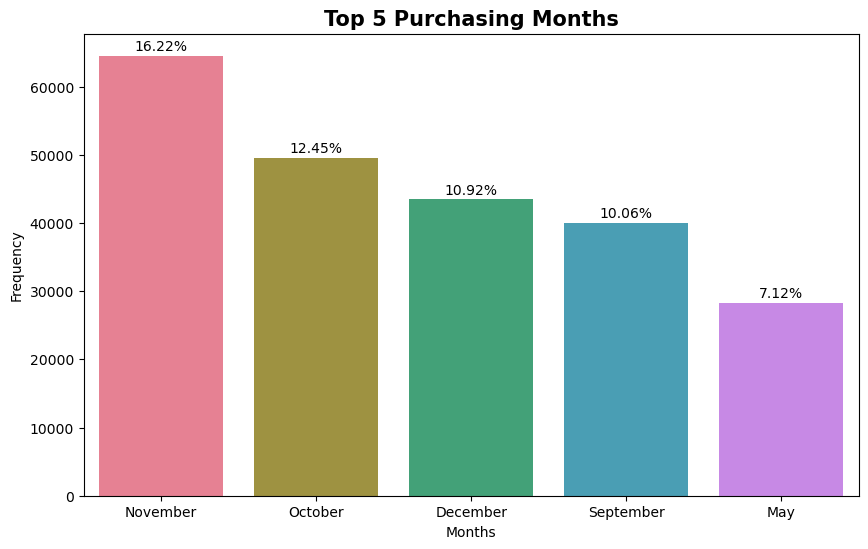

In [62]:
# Plotting top customers' purchasing in different five Months 
fig, ax = plt.subplots(figsize = (10,6))
sns.barplot(x = 'Month',y = 'Total Frequency',palette= 'husl',data = top_months[:5])
plt.xlabel('Months')
plt.ylabel('Frequency')
plt.title("Top 5 Purchasing Months", fontweight='bold',size=15)

for p in ax.patches:                               
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2, height+800, '{:1.2f}''%'.format(height/cl_retail_df.shape[0]*100),ha = "center", size = 10)

# *Top Days*

In [70]:
''' Creating dataframe for Invoice_Days counts
top_days = pd.DataFrame(cl_retail_df['Day'].value_counts().sort_values(ascending = False).reset_index())
top_days.rename(columns = {'index':'Day','Day':'Total Frequency'},inplace = True)
top_days.head()'''

" Creating dataframe for Invoice_Days counts\ntop_days = pd.DataFrame(cl_retail_df['Day'].value_counts().sort_values(ascending = False).reset_index())\ntop_days.rename(columns = {'index':'Day','Day':'Total Frequency'},inplace = True)\ntop_days.head()"

In [75]:
'''# Purchasings of customers on different days
fig, ax = plt.subplots(figsize = (10,6))
sns.barplot(x = 'Day',y = 'Total Frequency',palette= 'husl',data = top_days)
plt.xlabel('Day of the Week')
plt.ylabel('Frequency')
plt.title("Purchasing on different Days",fontweight='bold',size=15)

for p in ax.patches:                               
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2, height+800, '{:1.2f}''%'.format(height/cl_retail_df.shape[0]*100),ha = "center", size = 10)'''

'# Purchasings of customers on different days\nfig, ax = plt.subplots(figsize = (10,6))\nsns.barplot(x = \'Day\',y = \'Total Frequency\',palette= \'husl\',data = top_days)\nplt.xlabel(\'Day of the Week\')\nplt.ylabel(\'Frequency\')\nplt.title("Purchasing on different Days",fontweight=\'bold\',size=15)\n\nfor p in ax.patches:                               \n    height = p.get_height()\n    ax.text(p.get_x()+p.get_width()/2, height+800, \'{:1.2f}\'\'%\'.format(height/cl_retail_df.shape[0]*100),ha = "center", size = 10)'

# *Top Hours*

In [73]:
# Creating dataframe for Invoice_Months counts
top_hours = pd.DataFrame(cl_retail_df['Hour'].value_counts().sort_values(ascending = False).reset_index())
top_hours.rename(columns = {'index':'Hour','Hour':'Total Frequency'},inplace = True)
top_hours.head()

,Hour,Total Frequency
0,12,72069
1,13,64031
2,14,54127
3,11,49092
4,15,45372


Text(0.5, 1.0, 'Purchasing Hours')

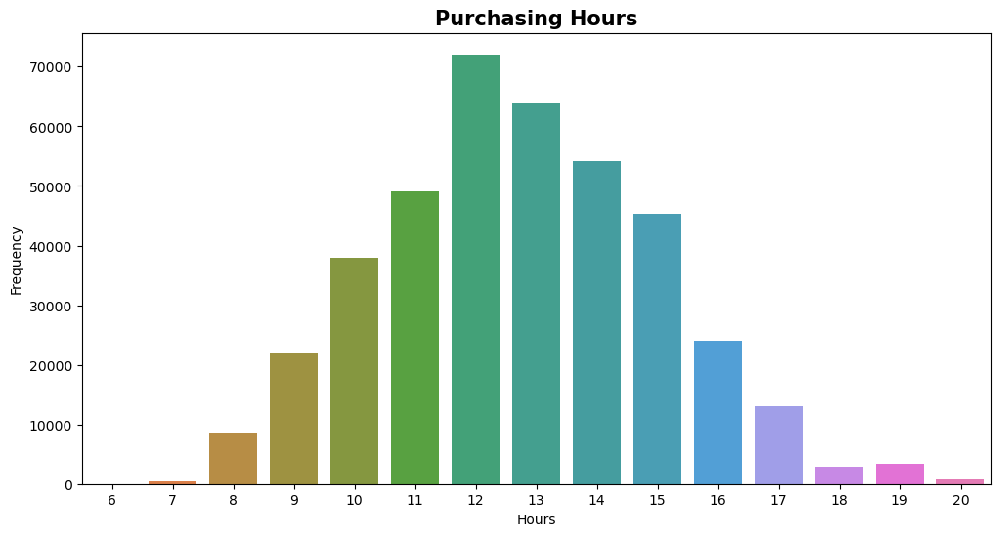

In [74]:
# Plotting purchases at different hours
plt.figure(figsize = (12,6))
sns.barplot(x = 'Hour',y = 'Total Frequency',palette = 'husl',data = top_hours)
plt.xlabel('Hours')
plt.ylabel('Frequency')
plt.title("Purchasing Hours",fontweight='bold',size=15)

# *Top Time Duration of Day*

In [76]:
def time_type(time):
  if(time==6 or time==7 or time==8 or time==9 or time==10 or time==11):
    return 'Morning'
  elif(time==12 or time==13 or time==14 or time==15 or time==16 or time==17):
    return 'Afternoon'
  else:
    return 'Evening'

In [77]:
cl_retail_df['Time_type'] = cl_retail_df['Hour'].apply(time_type)

Text(0.5, 1.0, 'Top Time Duration of Day')

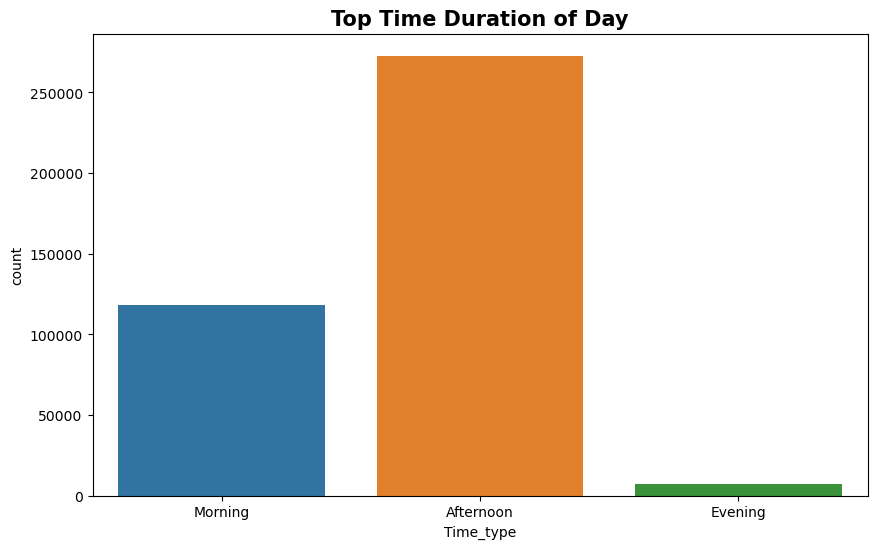

In [78]:
plt.figure(figsize=(10,6))
sns.countplot(x='Time_type',data= cl_retail_df)
plt.title('Top Time Duration of Day', fontweight='bold', size=15)

# Correlation

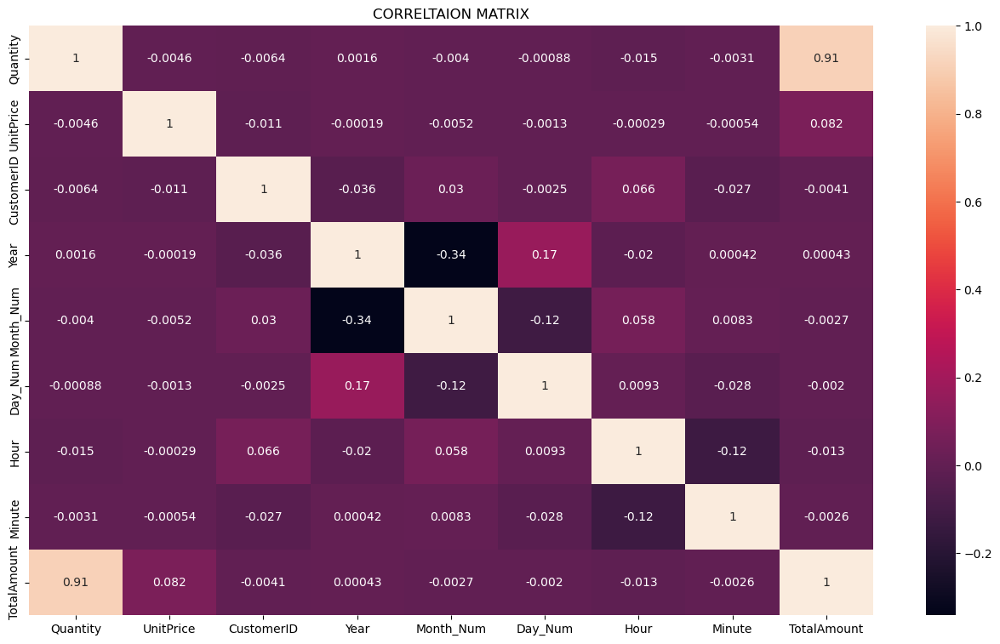

In [79]:
# correlation between various columns
plt.figure(figsize = (16,9))
sns.heatmap(cl_retail_df.corr(), annot = True)
plt.title('CORRELTAION MATRIX')
plt.show()

# RFM Model (Recency, Frequency, Monetary value)

In [80]:
#Setting Latest date: 2011-12-10 as last invoice date was 2011-12-09. To calculate the number of days from recent purchase.
Latest_Date = dt.datetime(2011,12,10)

#Create RFM Modelling scores for each customer
rfm_df = cl_retail_df.groupby('CustomerID').agg({'InvoiceDate': lambda x: (Latest_Date - x.max()).days, 'InvoiceNo': lambda x: len(x), 'TotalAmount': lambda x: x.sum()})

#Convert Invoice Date into type int
rfm_df['InvoiceDate'] = rfm_df['InvoiceDate'].astype(int)

#Rename column names to Recency, Frequency and Monetary
rfm_df.rename(columns={'InvoiceDate': 'Recency', 
                       'InvoiceNo': 'Frequency', 
                       'TotalAmount': 'Monetary'}, 
                        inplace=True)

rfm_df.reset_index().head()

,CustomerID,Recency,Frequency,Monetary
0,12346.0,325,1,77183.60
1,12347.0,2,182,4310.00
2,12348.0,75,31,1797.24
3,12349.0,18,73,1757.55
4,12350.0,310,17,334.40


In [81]:
#Descriptive statistics of Recency
rfm_df.Recency.describe()

count    4339.000000
mean       92.041484
std       100.007757
min         0.000000
25%        17.000000
50%        50.000000
75%       141.500000
max       373.000000
Name: Recency, dtype: float64

In [82]:
#Descriptive statistics of Frequency
rfm_df.Frequency.describe()

count    4339.000000
mean       91.708689
std       228.792852
min         1.000000
25%        17.000000
50%        41.000000
75%       100.000000
max      7847.000000
Name: Frequency, dtype: float64

In [83]:
#Descriptive statistics of Monetary
rfm_df.Monetary.describe()

count      4339.000000
mean       2053.793018
std        8988.248381
min           0.000000
25%         307.245000
50%         674.450000
75%        1661.640000
max      280206.020000
Name: Monetary, dtype: float64

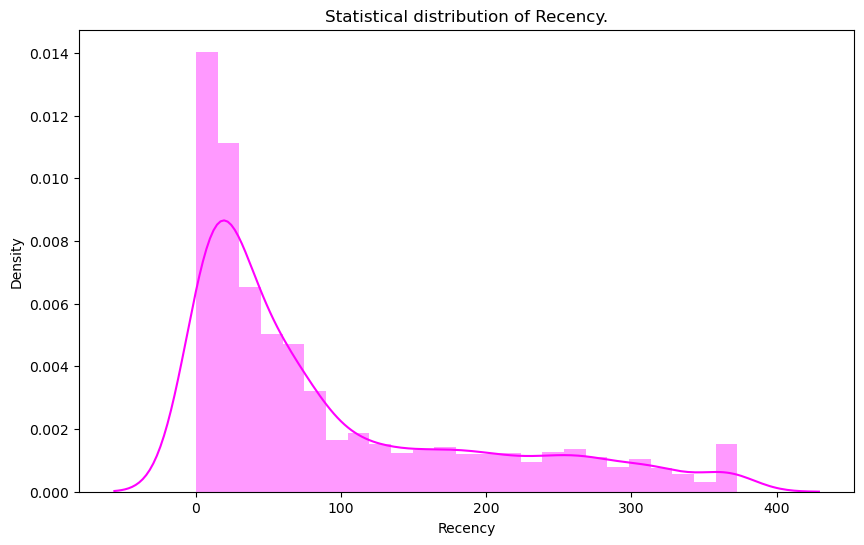

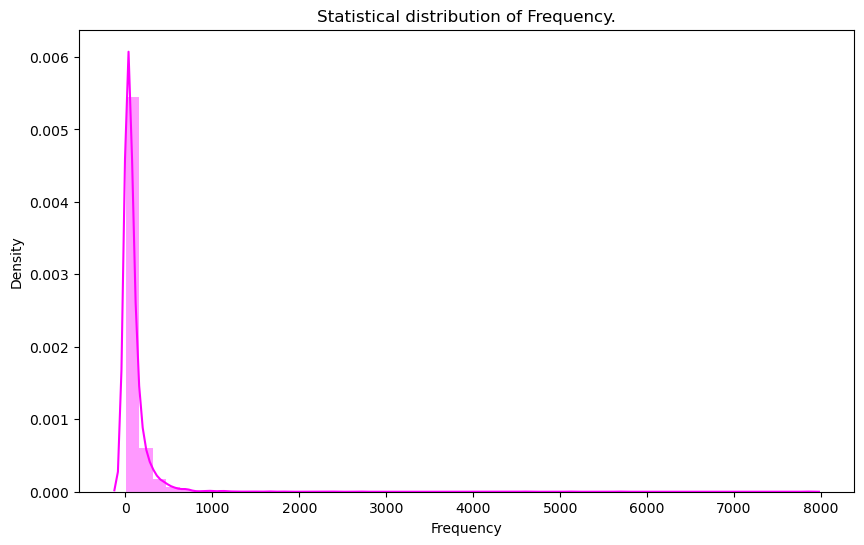

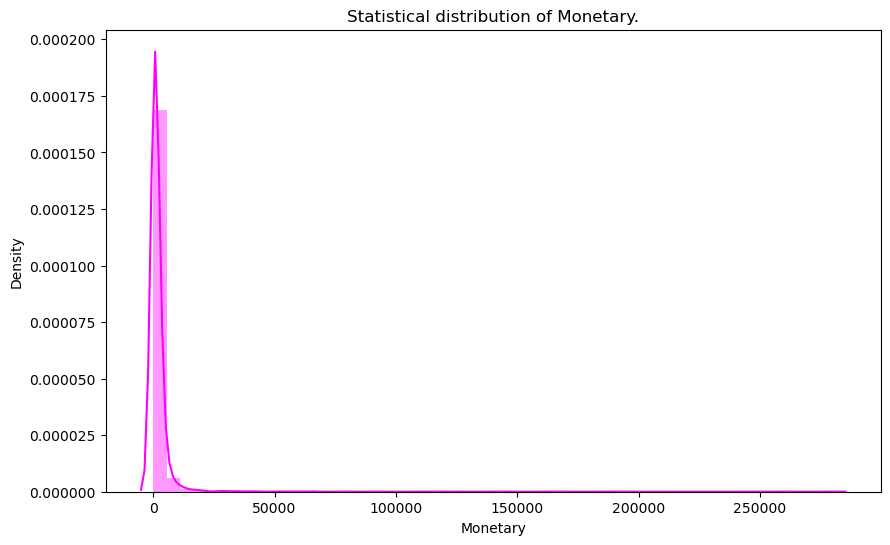

In [84]:
for col in rfm_df:
  fig=plt.figure(figsize=(10,6))
  ax=fig.gca()
  feature = (rfm_df[col])
  sns.distplot(rfm_df[col], ax=ax, color='magenta')
  ax.set_title(f'Statistical distribution of {col}.')
  plt.show()

# Quantile Split

In [85]:
#Split into four segments using quantiles
quantiles = rfm_df.quantile(q=[0.25,0.5,0.75])
quantiles = quantiles.to_dict()
quantiles

{'Recency': {0.25: 17.0, 0.5: 50.0, 0.75: 141.5},
 'Frequency': {0.25: 17.0, 0.5: 41.0, 0.75: 100.0},
 'Monetary': {0.25: 307.24499999999995, 0.5: 674.4499999999998, 0.75: 1661.64}}

In [86]:
#Function to create R, F and M segments
def RScoring(x,p,d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]: 
        return 3
    else:
        return 4
    
def FnMScoring(x,p,d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]: 
        return 2
    else:
        return 1

In [87]:
#Calculating and adding R, F and M segment value columns in the existing dataset to show R, F and M segment values
rfm_df['R'] = rfm_df['Recency'].apply(RScoring, args=('Recency',quantiles,))
rfm_df['F'] = rfm_df['Frequency'].apply(FnMScoring, args=('Frequency',quantiles,))
rfm_df['M'] = rfm_df['Monetary'].apply(FnMScoring, args=('Monetary',quantiles,))
rfm_df.head()

,Recency,Frequency,Monetary,R,F,M
CustomerID,,,,,,
12346.0,325,1,77183.60,4,4,1
12347.0,2,182,4310.00,1,1,1
12348.0,75,31,1797.24,3,3,1
12349.0,18,73,1757.55,2,2,1
12350.0,310,17,334.40,4,4,3


In [88]:
#Calculating and adding RFMGroup value column showing combined concatenated score of RFM
rfm_df['RFMGroup'] = rfm_df.R.map(str) + rfm_df.F.map(str) + rfm_df.M.map(str)
rfm_df.head()

,Recency,Frequency,Monetary,R,F,M,RFMGroup
CustomerID,,,,,,,
12346.0,325,1,77183.60,4,4,1,441
12347.0,2,182,4310.00,1,1,1,111
12348.0,75,31,1797.24,3,3,1,331
12349.0,18,73,1757.55,2,2,1,221
12350.0,310,17,334.40,4,4,3,443


In [89]:
#Calculating and adding RFMScore value column showing total sum of RFMGroup values
rfm_df['RFMScore'] = rfm_df[['R', 'F', 'M']].sum(axis = 1)
rfm_df.head()

,Recency,Frequency,Monetary,R,F,M,RFMGroup,RFMScore
CustomerID,,,,,,,,
12346.0,325,1,77183.60,4,4,1,441,9
12347.0,2,182,4310.00,1,1,1,111,3
12348.0,75,31,1797.24,3,3,1,331,7
12349.0,18,73,1757.55,2,2,1,221,5
12350.0,310,17,334.40,4,4,3,443,11


In [90]:
#Calculating and adding RFMScore value column showing total sum of RFMGroup values
rfm_df['RFMScore'] = rfm_df[['R', 'F', 'M']].sum(axis = 1)
rfm_df.head()

,Recency,Frequency,Monetary,R,F,M,RFMGroup,RFMScore
CustomerID,,,,,,,,
12346.0,325,1,77183.60,4,4,1,441,9
12347.0,2,182,4310.00,1,1,1,111,3
12348.0,75,31,1797.24,3,3,1,331,7
12349.0,18,73,1757.55,2,2,1,221,5
12350.0,310,17,334.40,4,4,3,443,11


In [91]:
#Handle negative and zero values so as to handle infinite numbers during log transformation
def handle_neg_n_zero(num):
    if num <= 0:
        return 1
    else:
        return num

In [92]:
#Apply handle_neg_n_zero function to Recency and Monetary columns 
rfm_df['Recency'] = [handle_neg_n_zero(x) for x in rfm_df.Recency]
rfm_df['Monetary'] = [handle_neg_n_zero(x) for x in rfm_df.Monetary]

#Perform Log transformation to bring data into normal or near normal distribution
Log_Tf = rfm_df[['Recency', 'Frequency', 'Monetary']].apply(np.log, axis = 1).round(3)

Text(0.5, 1.0, 'Normalized distribution of Recency')

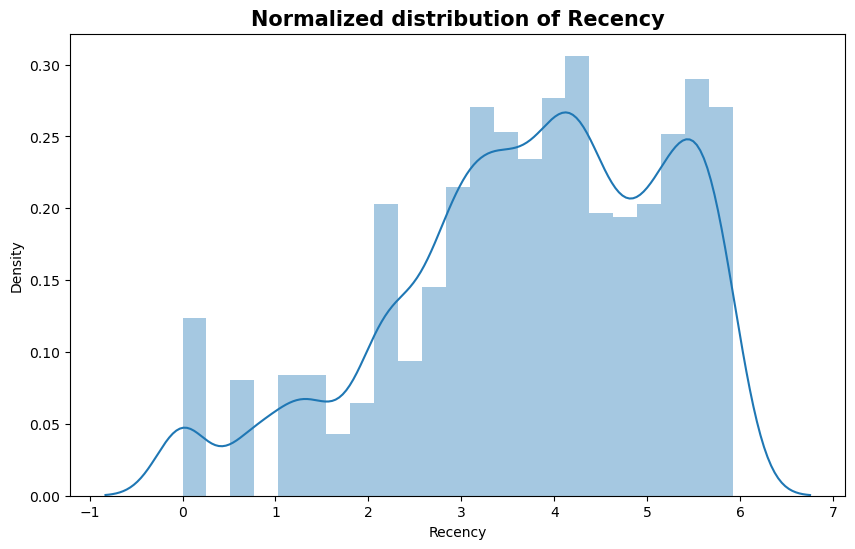

In [93]:
#Data distribution after data normalization for Recency
Recency_Plot = Log_Tf['Recency']
plt.figure(figsize=(10,6))
sns.distplot(Recency_Plot)
plt.title("Normalized distribution of Recency", fontweight='bold',size=15)

Text(0.5, 1.0, 'Normalized distribution of Monetary')

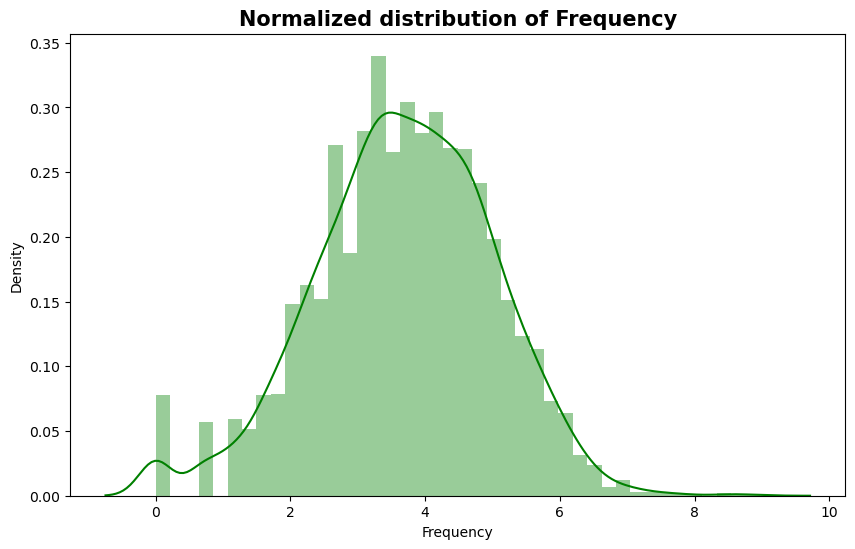

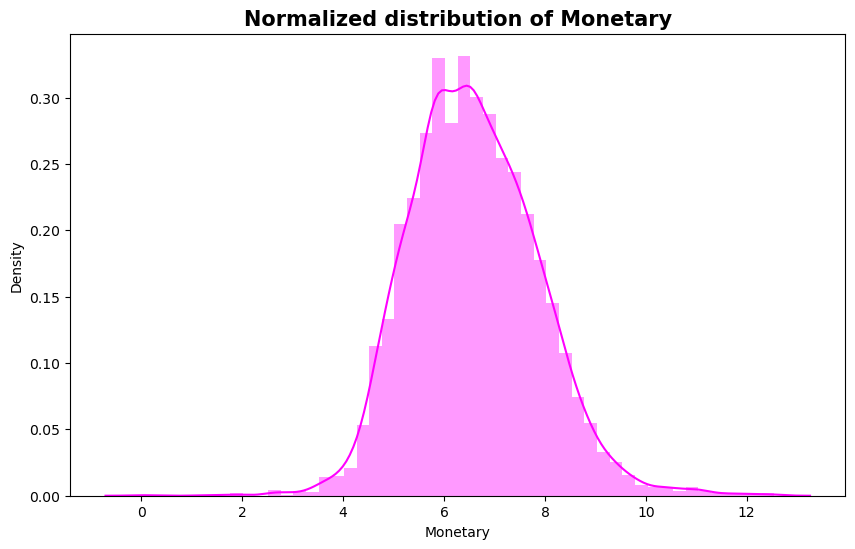

In [94]:
#Data distribution after data normalization for Frequency
Frequency_Plot = Log_Tf.query('Frequency < 1000')['Frequency']
plt.figure(figsize=(10,6))
sns.distplot(Frequency_Plot, color='green')
plt.title("Normalized distribution of Frequency", fontweight='bold',size=15)


#Data distribution after data normalization for Monetary
Monetary_Plot = Log_Tf.query('Monetary < 10000')['Monetary']
plt.figure(figsize=(10,6))
sns.distplot(Monetary_Plot, color='magenta')
plt.title("Normalized distribution of Monetary", fontweight='bold',size=15)

# Pre-Processing of RFM dataframe

In [95]:
# Importing library
from sklearn import preprocessing

In [96]:
rfm_df['Recency_log'] = rfm_df['Recency'].apply(math.log)
rfm_df['Frequency_log'] = rfm_df['Frequency'].apply(math.log)
rfm_df['Monetary_log'] = rfm_df['Monetary'].apply(math.log)

# Visualizing the relationship between R, F and M.

In [97]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

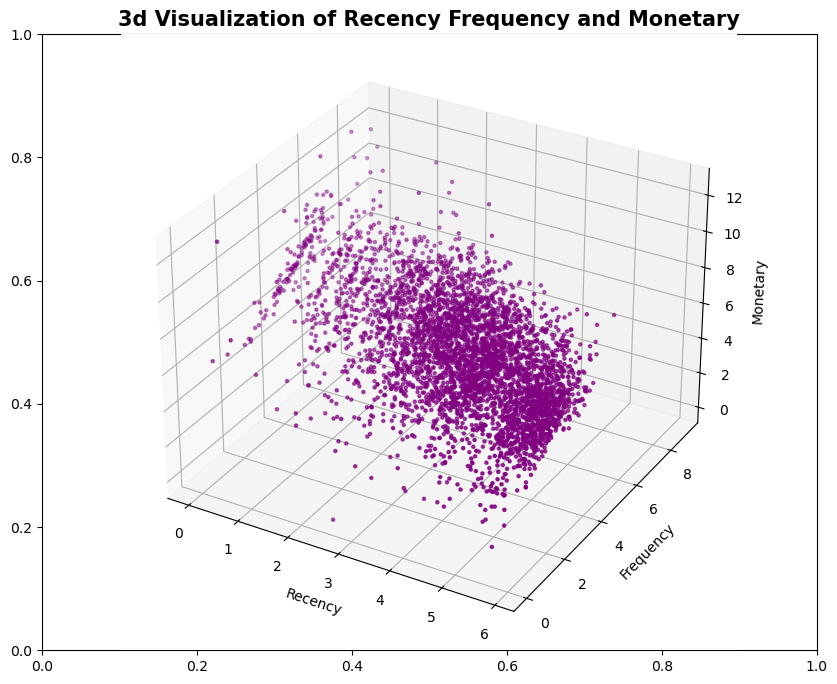

In [98]:
#visualizing RFM
fig=plt.figure(figsize=(10,8))
plt.title('3d Visualization of Recency Frequency and Monetary', fontweight='bold',size=15)
ax=fig.add_subplot(111,projection='3d')
xs=rfm_df.Recency_log
ys=rfm_df.Frequency_log
zs=rfm_df.Monetary_log

ax.scatter3D(xs,ys,zs,s=5, color ='purple')

ax.set_xlabel('Recency')
ax.set_ylabel('Frequency')
ax.set_zlabel('Monetary')
plt.show()

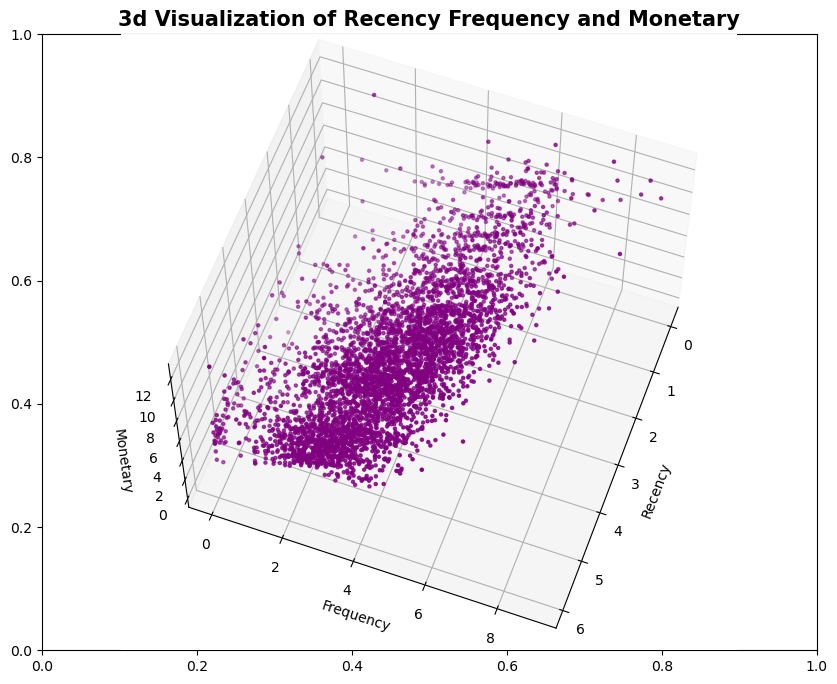

In [99]:
ax.view_init(60,20)
fig

# Model Development


In [101]:
# Importing libraries
from sklearn.metrics import silhouette_score
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import DBSCAN
from sklearn import metrics

# #A. Recency and Monetary

### Model 1: K-Means Clustering

In [103]:
#Applying Silhouette Score Method
features_rec_mon=['Recency_log','Monetary_log']
X_features_rec_mon=rfm_df[features_rec_mon].values

scaler_rec_mon=preprocessing.StandardScaler()

X_rec_mon=scaler_rec_mon.fit_transform(X_features_rec_mon)
X= X_rec_mon

In [104]:
features_rec_mon=['Recency_log','Monetary_log']
X_features_rec_mon=rfm_df[features_rec_mon].values

scaler_rec_mon=preprocessing.StandardScaler()

X_rec_mon=scaler_rec_mon.fit_transform(X_features_rec_mon)
X= X_rec_mon

In [105]:
range_n_clusters = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]

for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters)
    preds = clusterer.fit_predict(X)
    centers = clusterer.cluster_centers_

    score = silhouette_score(X, preds)
    print("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.4209094056671935
For n_clusters = 3, silhouette score is 0.3430608184527577
For n_clusters = 4, silhouette score is 0.3642927029227675
For n_clusters = 5, silhouette score is 0.33651864035957285
For n_clusters = 6, silhouette score is 0.34395815423996706
For n_clusters = 7, silhouette score is 0.34689839620053936
For n_clusters = 8, silhouette score is 0.3372914613246708
For n_clusters = 9, silhouette score is 0.34560718482127467
For n_clusters = 10, silhouette score is 0.34835302562354437
For n_clusters = 11, silhouette score is 0.33847249841073485
For n_clusters = 12, silhouette score is 0.3427662354442499
For n_clusters = 13, silhouette score is 0.3407950001355181
For n_clusters = 14, silhouette score is 0.34405101911426156
For n_clusters = 15, silhouette score is 0.3365074564804277
For n_clusters = 16, silhouette score is 0.3404965942322723


In [106]:
#Applying Elbow Method
fea_rec_mon=['Recency_log','Monetary_log']
X_fea_rec_mon=rfm_df[fea_rec_mon].values

scaler_rec_mon=preprocessing.StandardScaler()

X_rec_mon=scaler_rec_mon.fit_transform(X_fea_rec_mon)
X=X_rec_mon

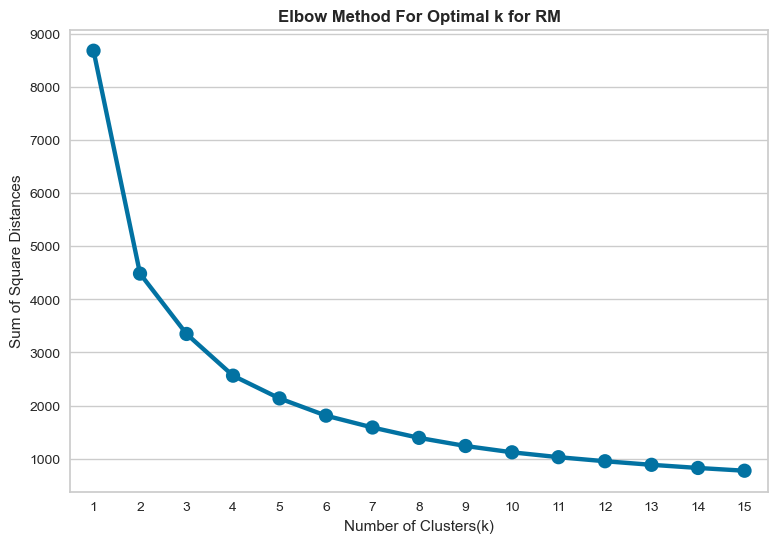

In [107]:
sum_of_sq_dist = {}
for k in range(1,16):
    km = KMeans(n_clusters= k, init= 'k-means++', max_iter= 1000)
    km = km.fit(X)
    sum_of_sq_dist[k] = km.inertia_
    
#Plot the graph for the sum of square distance values and Number of Clusters
plt.figure(figsize = (9,6))
plt.grid(True)
sns.pointplot(x = list(sum_of_sq_dist.keys()), y = list(sum_of_sq_dist.values()))
plt.xlabel('Number of Clusters(k)')
plt.ylabel('Sum of Square Distances')
plt.title('Elbow Method For Optimal k for RM',fontweight = 'bold')
plt.show()

In [108]:
# plotting clusters
kmeans = KMeans(n_clusters=2)
kmeans.fit(X)
y_kmeans= kmeans.predict(X)

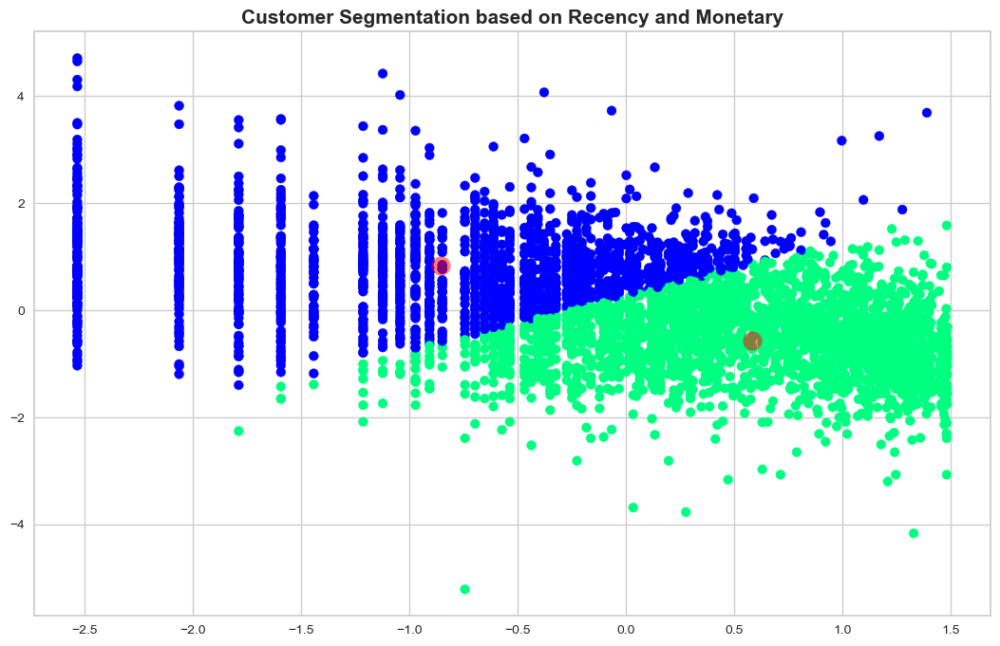

In [109]:
plt.figure(figsize=(13,8))
plt.title('Customer Segmentation based on Recency and Monetary', fontweight='bold', size=15)
plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap='winter')

centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=0.5)

### Model 2: DBSCAN

Text(0.5, 1.0, 'DBSCAN on Regency and Frequency')

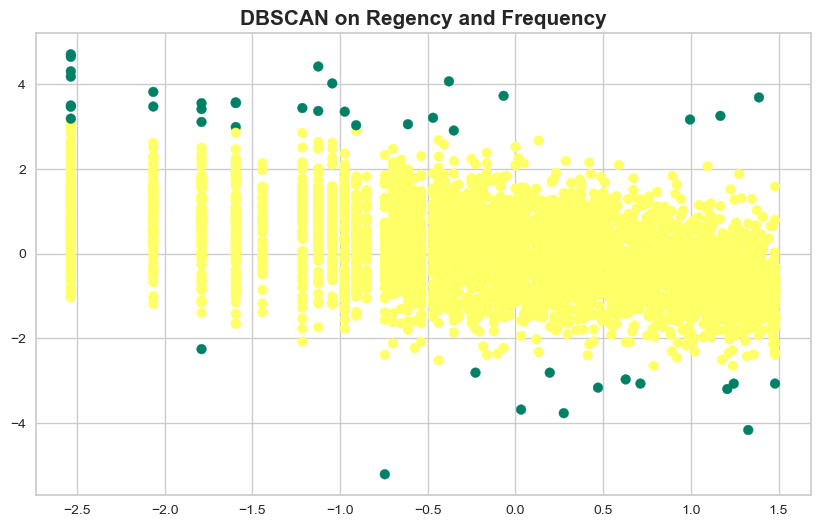

In [110]:
y_pred = DBSCAN(eps=0.5, min_samples=16).fit_predict(X)
plt.figure(figsize=(10,6))
plt.scatter(X[:,0], X[:,1], c=y_pred, cmap='summer')
plt.title('DBSCAN on Regency and Frequency', fontweight='bold', size=15)

## B. Frquency and Monetary

In [111]:
#Applying Silhouette Score Method
features_fre_mon = ['Frequency_log','Monetary_log']
X_features_fre_mon= rfm_df[features_fre_mon].values

scaler_fre_mon = preprocessing.StandardScaler()

X_fre_mon = scaler_fre_mon.fit_transform(X_features_fre_mon)
X= X_fre_mon

In [112]:
range_n_clusters = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]

for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters)
    preds = clusterer.fit_predict(X)
    centers = clusterer.cluster_centers_

    score = silhouette_score(X, preds)
    print("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.4782608772260966
For n_clusters = 3, silhouette score is 0.4076678169586367
For n_clusters = 4, silhouette score is 0.37138048759297515
For n_clusters = 5, silhouette score is 0.3449134170087184
For n_clusters = 6, silhouette score is 0.3600725475430104
For n_clusters = 7, silhouette score is 0.34351802761596906
For n_clusters = 8, silhouette score is 0.3516171234467734
For n_clusters = 9, silhouette score is 0.34654540059691386
For n_clusters = 10, silhouette score is 0.36082490211780227
For n_clusters = 11, silhouette score is 0.36812345072735597
For n_clusters = 12, silhouette score is 0.35327480037277975
For n_clusters = 13, silhouette score is 0.3616939991627955
For n_clusters = 14, silhouette score is 0.3662372097082454
For n_clusters = 15, silhouette score is 0.3600828106554917
For n_clusters = 16, silhouette score is 0.3500181932877601


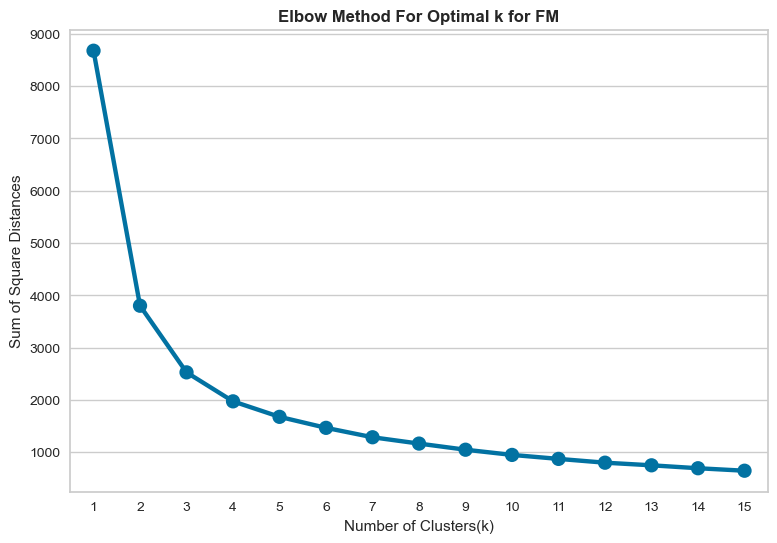

In [113]:
#Applying Elbow Method
sum_of_sq_dist = {}
for k in range(1,16):
    km = KMeans(n_clusters= k, init= 'k-means++', max_iter= 1000)
    km = km.fit(X)
    sum_of_sq_dist[k] = km.inertia_
    

#Plot the graph for the sum of square distance values and Number of Clusters
plt.figure(figsize = (9,6))
plt.grid(True)
sns.pointplot(x = list(sum_of_sq_dist.keys()), y = list(sum_of_sq_dist.values()))
plt.xlabel('Number of Clusters(k)')
plt.ylabel('Sum of Square Distances')
plt.title('Elbow Method For Optimal k for FM', fontweight = 'bold')
plt.show()

In [114]:
kmeans = KMeans(n_clusters=2)
kmeans.fit(X)
y_kmeans= kmeans.predict(X)

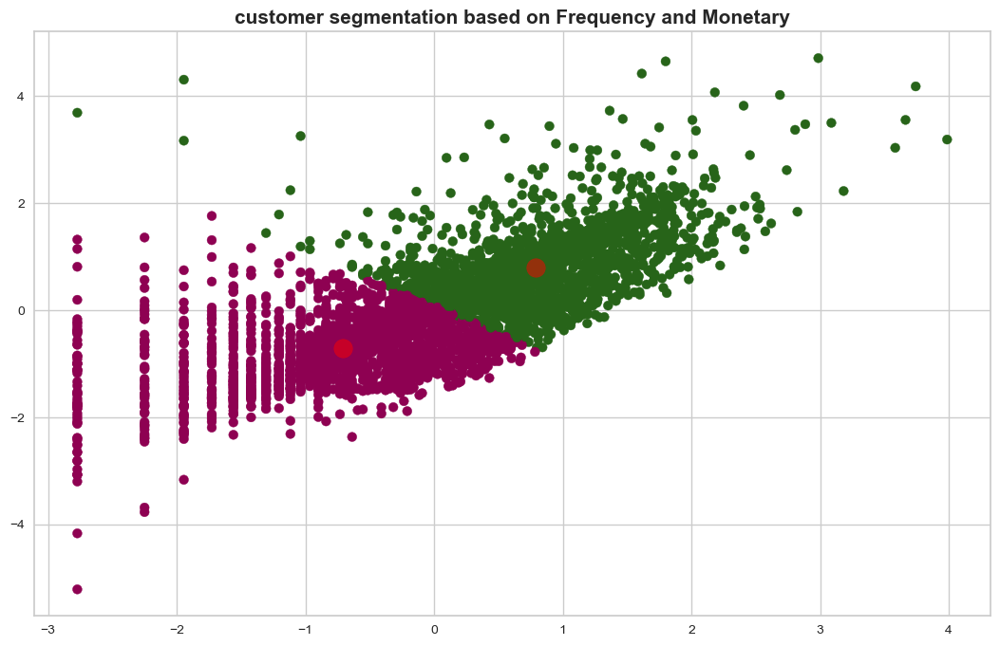

In [115]:
plt.figure(figsize=(13,8))
plt.title('customer segmentation based on Frequency and Monetary',fontweight='bold', size=15)
plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap='PiYG')

centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=0.5)

### Model 2: DBSCAN

Text(0.5, 1.0, 'DBSCAN on Frequency and Monetary')

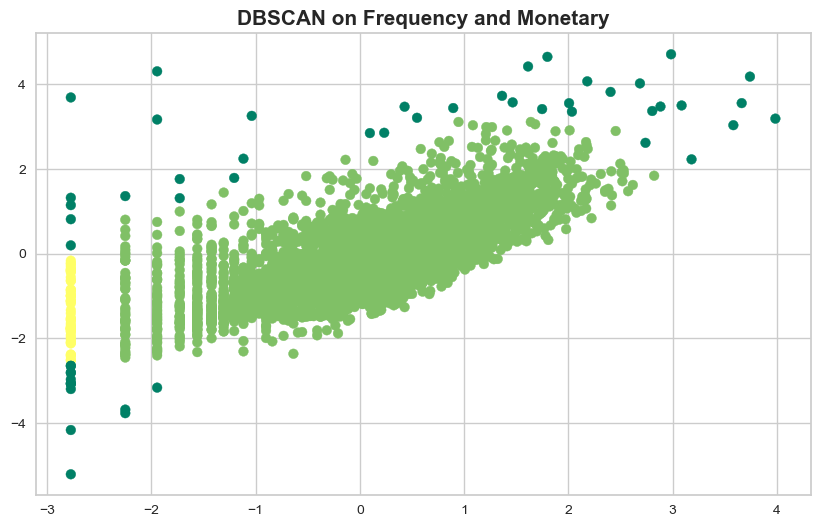

In [116]:
y_pred = DBSCAN(eps=0.5, min_samples=16).fit_predict(X)
plt.figure(figsize=(10,6))
plt.scatter(X[:,0], X[:,1], c=y_pred, cmap='summer')
plt.title('DBSCAN on Frequency and Monetary', fontweight='bold', size=15)

## *Comparing the cluster spread between RF & FM*


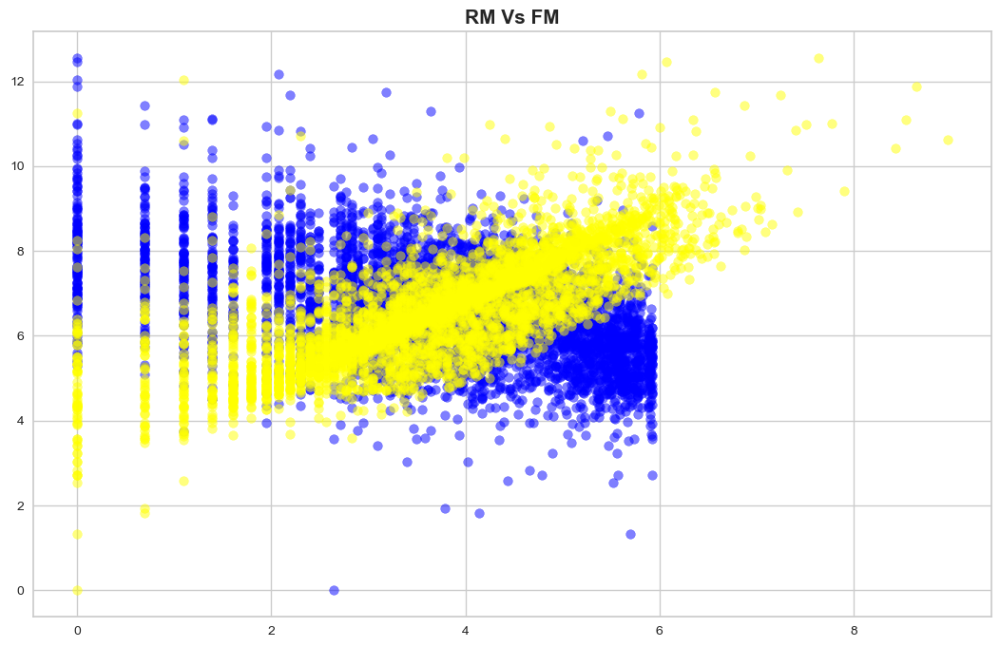

In [117]:
plt.figure(figsize=(13,8))
plt.title('RM Vs FM', fontweight='bold',size=15)
plt.scatter(rfm_df.Recency_log,rfm_df.Monetary_log,alpha=0.5, color='blue')
plt.scatter(rfm_df.Frequency_log,rfm_df.Monetary_log,alpha=0.5, color='yellow')

## C. Recency ,Frequency and Monetary

In [118]:
#Applying Silhouette Method

In [119]:
feature_vector=['Recency_log','Frequency_log','Monetary_log']
X_features=rfm_df[feature_vector].values

scaler=preprocessing.StandardScaler()

X=scaler.fit_transform(X_features)

For n_clusters = 2 The average silhouette_score is : 0.3951770707909246
For n_clusters = 3 The average silhouette_score is : 0.3028168386903721
For n_clusters = 4 The average silhouette_score is : 0.3017123663809571
For n_clusters = 5 The average silhouette_score is : 0.2785661461874347
For n_clusters = 6 The average silhouette_score is : 0.27885758546690703
For n_clusters = 7 The average silhouette_score is : 0.26198642962742774
For n_clusters = 8 The average silhouette_score is : 0.26471675852789284
For n_clusters = 9 The average silhouette_score is : 0.2530153778663923
For n_clusters = 10 The average silhouette_score is : 0.2530579934556927
For n_clusters = 11 The average silhouette_score is : 0.25926997752720254
For n_clusters = 12 The average silhouette_score is : 0.26592784520282725
For n_clusters = 13 The average silhouette_score is : 0.2621284616521827
For n_clusters = 14 The average silhouette_score is : 0.2609563057895865
For n_clusters = 15 The average silhouette_score is : 

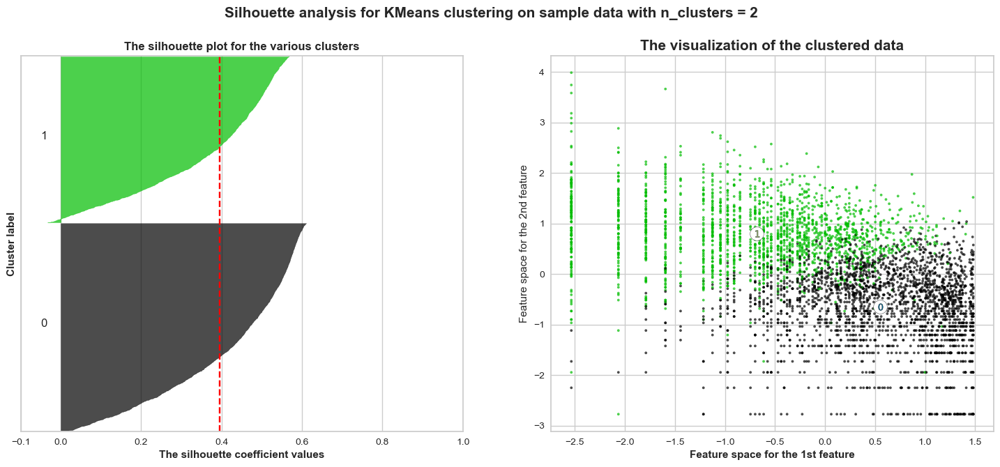

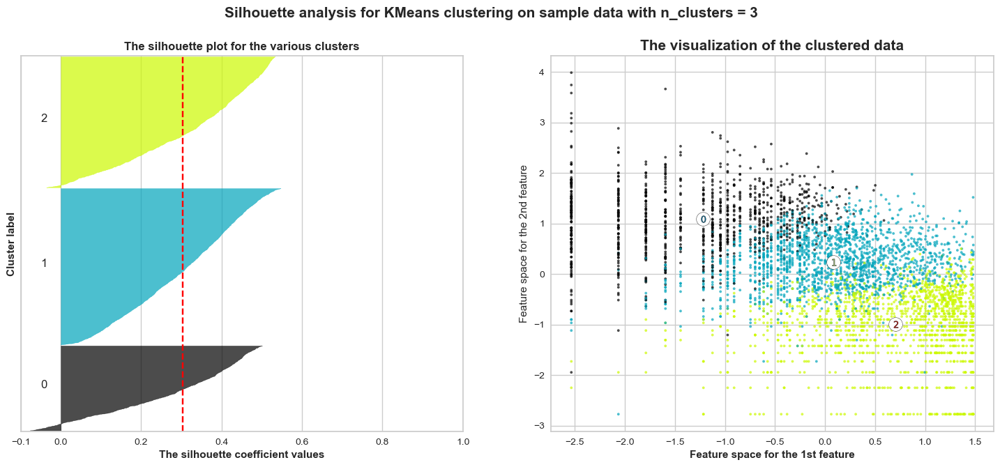

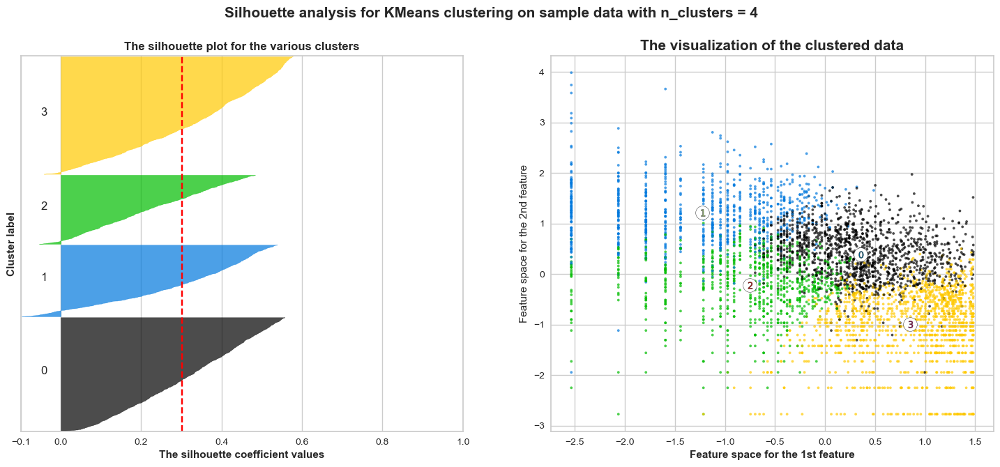

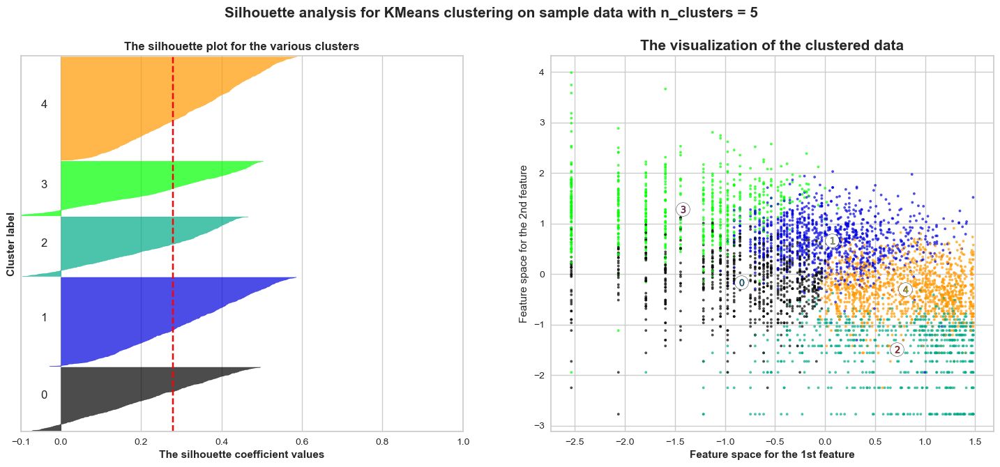

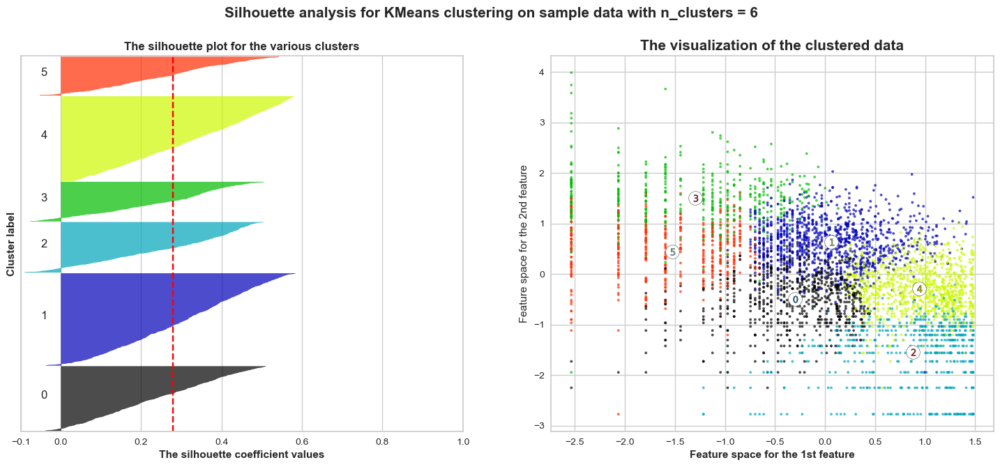

...

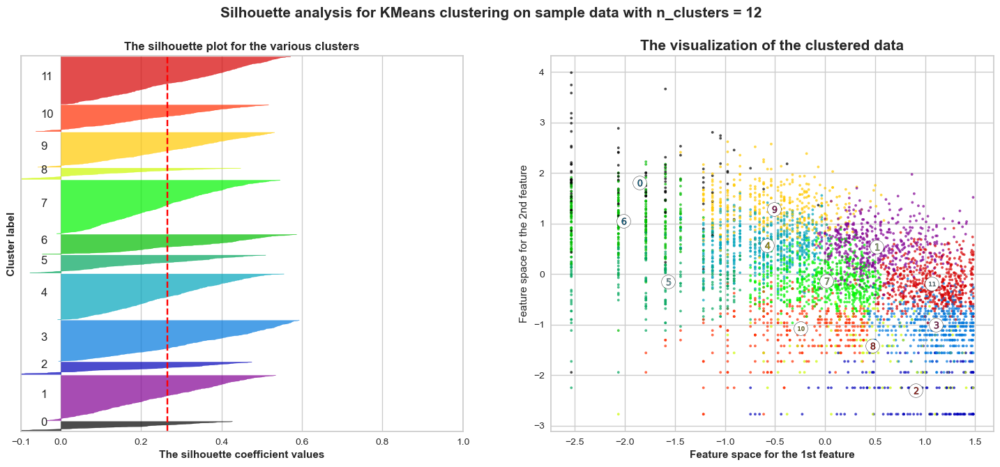

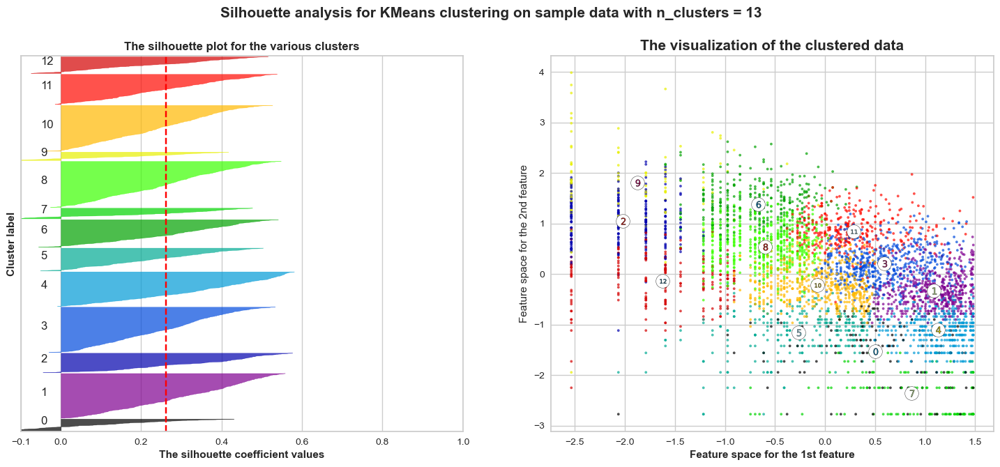

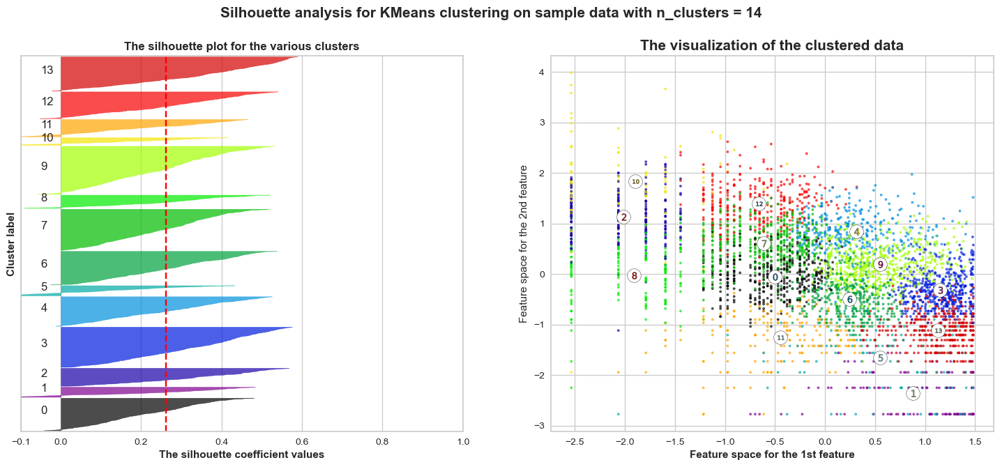

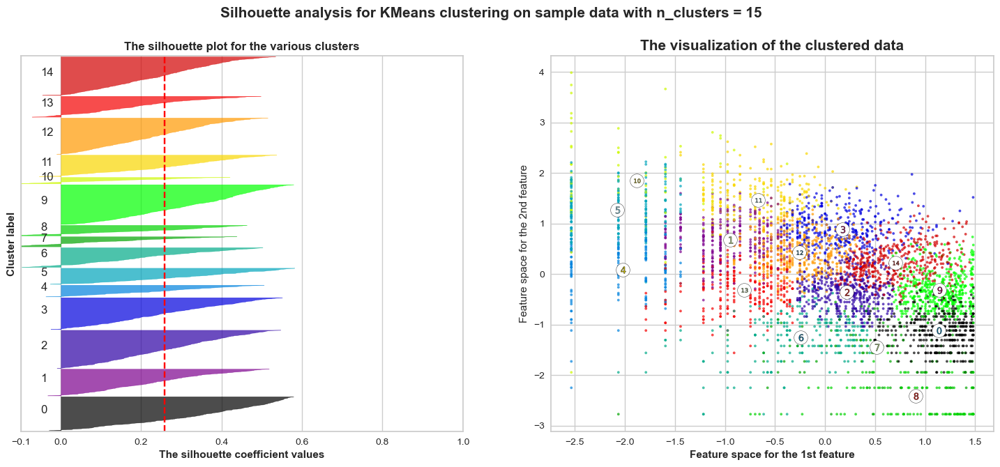

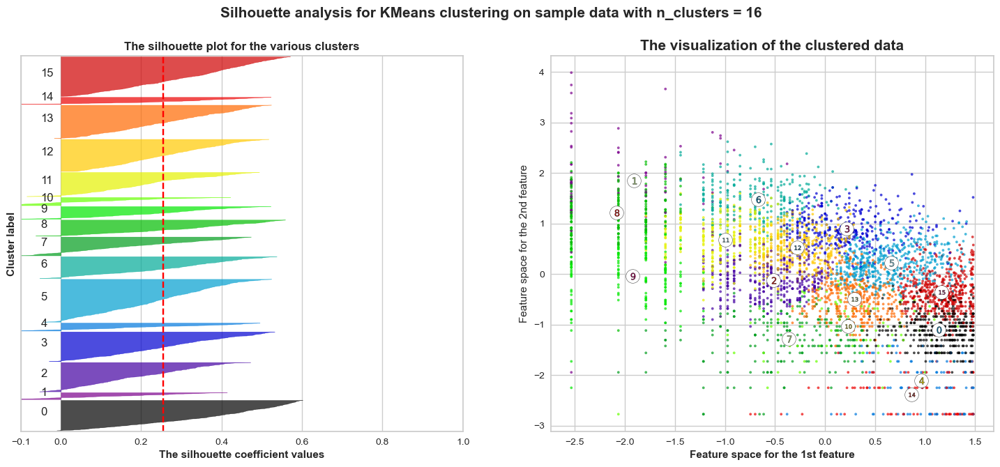

In [123]:
range_n_clusters = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters", fontweight='bold')
    ax1.set_xlabel("The silhouette coefficient values", fontweight='bold')
    ax1.set_ylabel("Cluster label", fontweight='bold')

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) /n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data", fontweight='bold', size=15)
    ax2.set_xlabel("Feature space for the 1st feature", fontweight='bold')
    ax2.set_ylabel("Feature space for the 2nd feature")
    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=15, fontweight='bold')

plt.show()

In [124]:
kmeans = KMeans(n_clusters=3)
kmeans.fit(X)
y_kmeans= kmeans.predict(X)

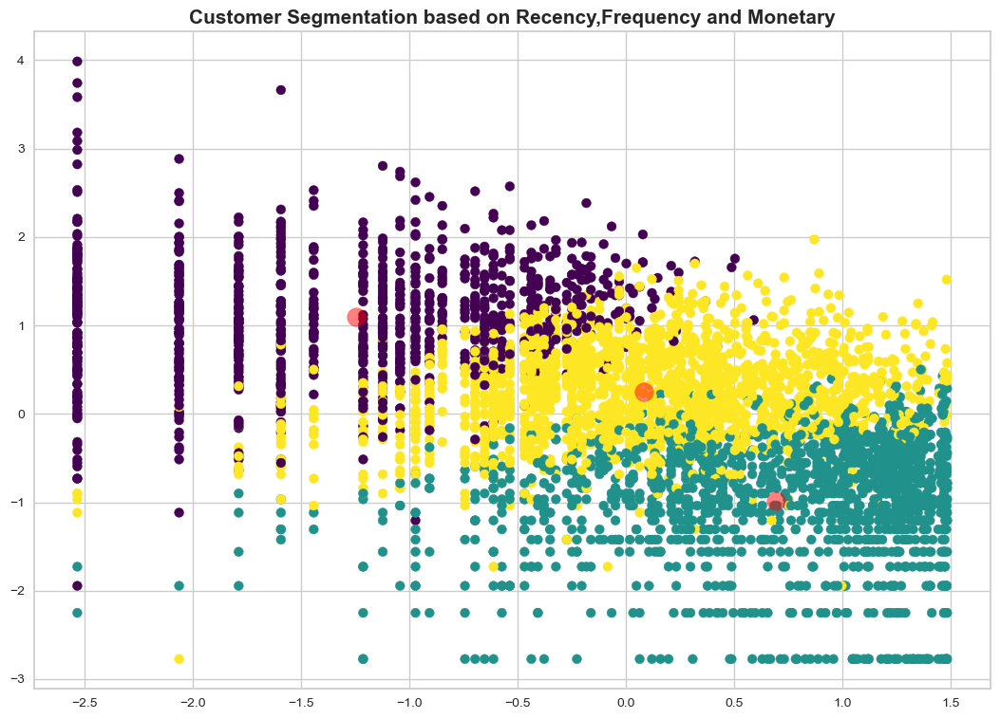

In [125]:
plt.figure(figsize=(13,9))
plt.title('Customer Segmentation based on Recency,Frequency and Monetary', fontweight='bold', size=15)
plt.scatter(X[:, 0], X[:, 1], c=y_kmeans, s=50, cmap='viridis')

centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='red', s=200, alpha=0.5)

In [126]:
#Applying Elbow Method

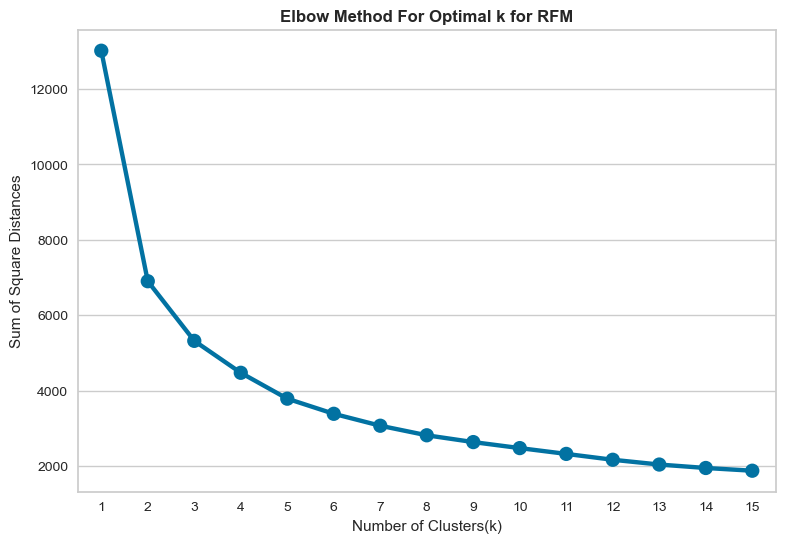

In [127]:
sum_of_sq_dist = {}
for k in range(1,16):
    km = KMeans(n_clusters= k, init= 'k-means++', max_iter= 1000)
    km = km.fit(X)
    sum_of_sq_dist[k] = km.inertia_
    
  
#Plot the graph for the sum of square distance values and Number of Clusters
plt.figure(figsize = (9,6))
plt.grid(True)
sns.pointplot(x = list(sum_of_sq_dist.keys()), y = list(sum_of_sq_dist.values()))
plt.xlabel('Number of Clusters(k)')
plt.ylabel('Sum of Square Distances')
plt.title('Elbow Method For Optimal k for RFM',fontweight='bold')
plt.show()

In [128]:
#Perform K-Mean Clustering or build the K-Means clustering model
KMean_clust = KMeans(n_clusters= 3, init= 'k-means++', max_iter= 1000)
KMean_clust.fit(X)

#Find the clusters for the observation given in the dataset
rfm_df['Cluster'] = KMean_clust.labels_
rfm_df.head(10)

,Recency,Frequency,Monetary,R,F,M,RFMGroup,RFMScore,Recency_log,Frequency_log,Monetary_log,Cluster
CustomerID,,,,,,,,,,,,
12346.0,325,1,77183.60,4,4,1,441,9,5.783825,0.000000,11.253942,0
12347.0,2,182,4310.00,1,1,1,111,3,0.693147,5.204007,8.368693,1
12348.0,75,31,1797.24,3,3,1,331,7,4.317488,3.433987,7.494007,0
12349.0,18,73,1757.55,2,2,1,221,5,2.890372,4.290459,7.471676,0
12350.0,310,17,334.40,4,4,3,443,11,5.736572,2.833213,5.812338,2
12352.0,36,85,2506.04,2,2,1,221,5,3.583519,4.442651,7.826459,0
12353.0,204,4,89.00,4,4,4,444,12,5.318120,1.386294,4.488636,2
12354.0,232,58,1079.40,4,2,2,422,8,5.446737,4.060443,6.984161,0
12355.0,214,13,459.40,4,4,3,443,11,5.365976,2.564949,6.129921,2


### Model 3: Hierarical Clustering

In [129]:
#Dendogram for Getting Optimal Number of Clusters

In [130]:
# Importing library
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering

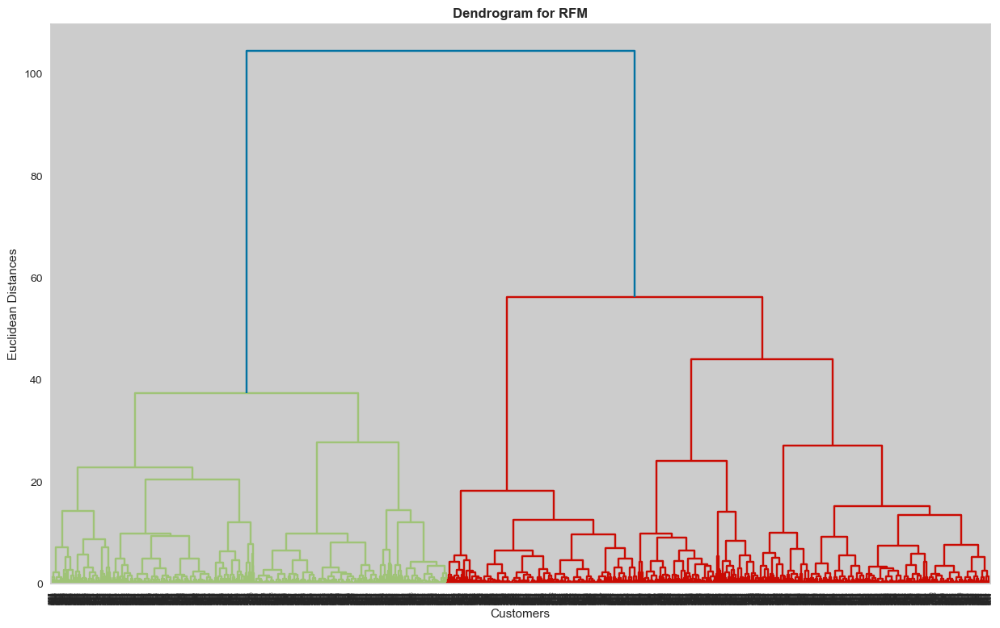

In [131]:
# Using the dendogram to find the optimal number of clusters
plt.figure(figsize=(15,9))
dendrogram = sch.dendrogram(sch.linkage(X, method = 'ward'))
plt.title('Dendrogram for RFM', fontweight= 'bold')
plt.xlabel('Customers')
plt.ylabel('Euclidean Distances')
plt.show() # find largest vertical distance we can make without crossing any other horizontal line

In [132]:
# Fitting hierarchical clustering to the mall dataset
hc = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'ward')
y_hc = hc.fit_predict(X)

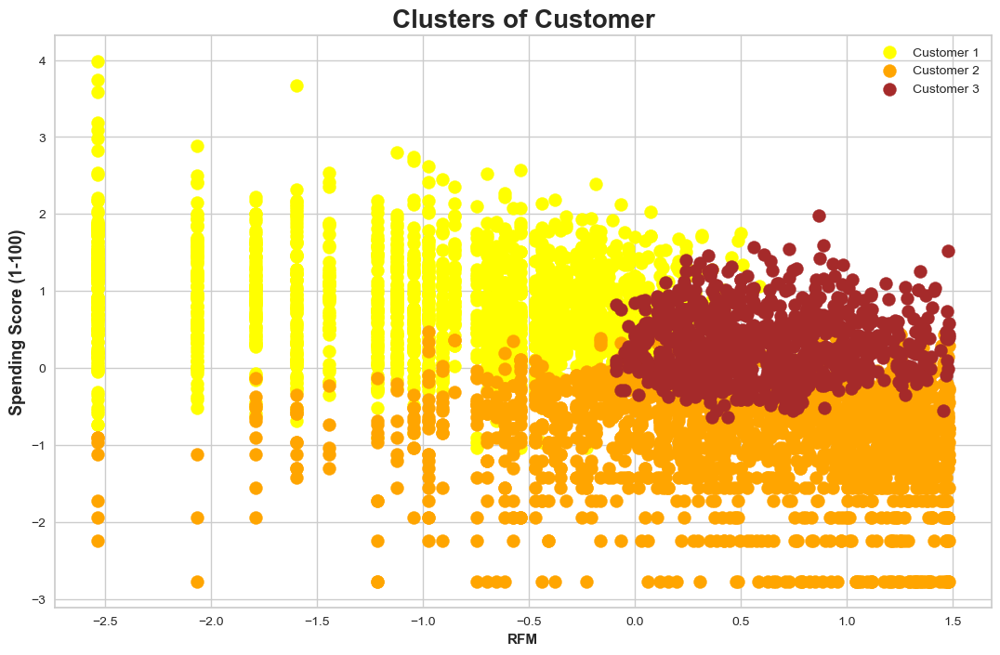

In [133]:
# Visualizing the clusters (two dimensions only)
plt.figure(figsize=(13,8))
plt.scatter(X[y_hc == 0, 0], X[y_hc == 0, 1], s = 100, c = 'yellow', label = 'Customer 1')
plt.scatter(X[y_hc == 1, 0], X[y_hc == 1, 1], s = 100, c = 'orange', label = 'Customer 2')
plt.scatter(X[y_hc == 2, 0], X[y_hc == 2, 1], s = 100, c = 'brown', label = 'Customer 3')

plt.title('Clusters of Customer', size = 20, fontweight = 'bold')
plt.xlabel('RFM', fontweight = 'bold')
plt.ylabel('Spending Score (1-100)', size = 13, fontweight = 'bold')
plt.legend()
plt.show()

### Model 2: DBSCAN

Text(0.5, 1.0, 'DBSCAN on RFM')

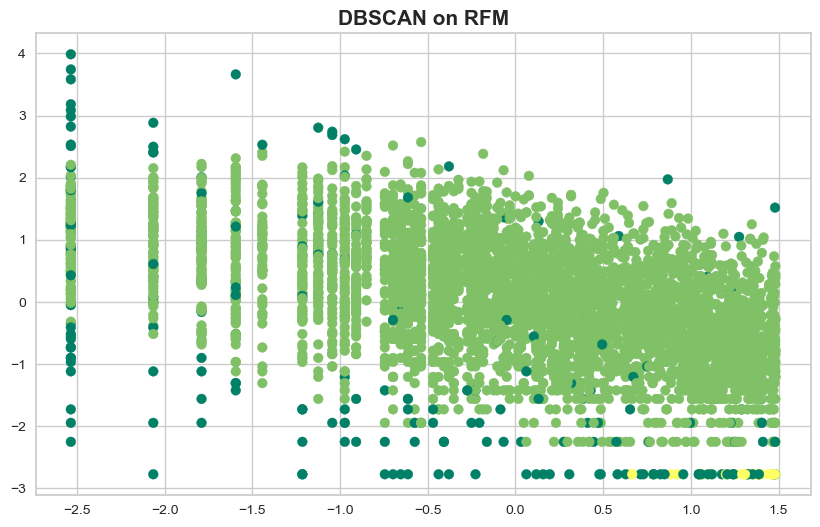

In [134]:
y_pred = DBSCAN(eps=0.5, min_samples=16).fit_predict(X)
plt.figure(figsize=(10,6))
plt.scatter(X[:,0], X[:,1], c=y_pred, cmap='summer')
plt.title('DBSCAN on RFM', fontweight='bold', size=15)

In [137]:
from prettytable import PrettyTable 

# Specify the Column Names while initializing the Table 
myTable = PrettyTable(['SL No.',"Model_Name",'Data', "Optimal_Number_of_Cluster"]) 
  
# Add rows 
myTable.add_row(['1',"K-Means with Silhouette_score", "RM", "2"]) 
myTable.add_row(['2',"K-Means with Elbow method", "RM", "2"])
myTable.add_row(['3',"DBSCAN ", "RM", "2"]) 

myTable.add_row(['4',"K-Means with Silhouette_score ", "FM", "2"]) 
myTable.add_row(['5',"K-Means with Elbow method", "FM", "2"])
myTable.add_row(['6',"DBSCAN", "FM", "3"])

myTable.add_row(['7',"K-Means with Silhouette_score", "RFM", "3"]) 
myTable.add_row(['8',"K-Means with Elbow method", "RFM", "3"])
myTable.add_row(['9',"Hierarchical clustering", "RFM", "3"])
myTable.add_row(['10',"DBSCAN", "RFM", "3"])
print(myTable)

+--------+--------------------------------+------+---------------------------+
| SL No. |           Model_Name           | Data | Optimal_Number_of_Cluster |
+--------+--------------------------------+------+---------------------------+
|   1    | K-Means with Silhouette_score  |  RM  |             2             |
|   2    |   K-Means with Elbow method    |  RM  |             2             |
|   3    |            DBSCAN              |  RM  |             2             |
|   4    | K-Means with Silhouette_score  |  FM  |             2             |
|   5    |   K-Means with Elbow method    |  FM  |             2             |
|   6    |             DBSCAN             |  FM  |             3             |
|   7    | K-Means with Silhouette_score  | RFM  |             3             |
|   8    |   K-Means with Elbow method    | RFM  |             3             |
|   9    |    Hierarchical clustering     | RFM  |             3             |
|   10   |             DBSCAN             | RFM  |  

In [136]:
!pip install prettytable

# Conclusion

## A. EDA

Our data possessed with null values in Customer_Id means there are no information available about their customer IDs. So, keeping them in the dataset would make no sense while applying clusterring. Along with some duplicates values were also removed.

In Exploratory data analysis we find out different insights like:-

Top Customer IDs: 17841.0, 14911.0, 14096.0, 12748.0, 14606.0
Top Five Countries: Uniter Kingdom(88.95%), Germany(2.33%), France(1.84%), Ireland(1.84%) and Spain(0.62%).
Top Five products purchasing on the basis of frequency(How frequent customers are willing to bought these products):
WHITE HANGING HEART T-LIGHT HOLDER,
REGENCY CAKESTAND 3 TIER,
JUMBO BAG RED RETROSPOT,
PARTY BUNTING and
ASSORTED COLOUR BIRD ORNAMENT.
Top stock code on the basis of count values: 85123A, 22423, 85099B, 47566 and 84879.
We did some feature engineering like creating new columns with InvoiceDate for e.g.,Year, Month, Day, Hour, Month_Num and Day_Num. Total Amount also calculated using features product between unit price and quantity.

Which Year produced maximum business: 2011

Month which give maximum business: November, October, December, September and May.

Maximum purchasing on different days: Thursday > Wednesday > Tuesday > Monday > Saturday > Friday.

Most of the customers usually purchase products in between 10:00 A.M to 2:00 P.M.

Top time duration of a day for purchasing: Afternoon > Morning > Evening.
On point of overall business context: 97.79% did good business making customers happy while 2.21% did bad business as customers cancelled their orders.

## B. Algorithm

RFM(Recency, Frequency and Monetary) dataframe ease our problem to solve in a particular order, it makes easy to recommend and display new launched products to few customers.

We applied different clustering algorithms on our given dataset:

1) Clustering Recency & Monetary (RM) - {No. of Clusters - 2}

K-Means with Silhouette_score
K-Means with Elbow Method
DBSCAN
2) Clustering Frequency & Monetary (FM) - {No. of Clusters - 2}

K-Means with Silhouette_score
K-Means with Elbow Method
DBSCAN {No. of Clusters - 3}
3) Clustering Recency, Frequency & Monetary (RFM) - {No. of Clusters - 3}

K-Means with Silhouette_score
K-Means with Elbow Method
DBSCAN
Hierarchical Clustering